In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.decomposition import PCA
import umap
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score


In [ ]:
import warnings
warnings.filterwarnings('ignore')

#### Load Data

In [ ]:
# Load DeepMHC data for neoantigen HLA binders and SCLC subtype label
'''
data format: rows = patients, columns = genes
data file names indicate binding for HLA A, HLA B, and both HLA A and HLA B
'''
# paths to data generated from DeepMHCi, 0.1
data_hla_A_1 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_0.1_A.csv', header=0, index_col=0)
data_hla_B_1 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_0.1_B.csv', header=0, index_col=0)
data_hla_AB_1 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_limit=1_combined.csv', header=0, index_col=0)

# paths to data generated from DeepMHCi, 0.2
data_hla_A_2 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_0.2_A.csv', header=0, index_col=0)
data_hla_B_2 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_0.2_B.csv', header=0, index_col=0)
data_hla_AB_2 = pd.read_csv('/content/drive/Shareddrives/BMI212/Analysis/results_Jun/gene_counts_per_sample_deepmhci_SCLC_limit=2_combined.csv', header=0, index_col=0)

# subtype labels
subtype_path = "/content/drive/Shareddrives/BMI212/AIM2/subtype_mapping.xlsx"
subtype_df = pd.read_excel(subtype_path, index_col=0, header=0)

In [ ]:
# data_names = ['HLA-A', 'HLA-B', 'HLA-A and HLA-B']
# data = [data_hla_A, data_hla_B, data_hla_AB]
data_names_1 = ['SCLC: HLA-A, 0.1', 'SCLC: HLA-B, 0.1', 'SCLC: Combined, 0.1']
data_1 = [data_hla_A_1, data_hla_B_1, data_hla_AB_1]

for data, name in zip(data_1, data_names_1):
  print(f"{name}: {data.shape}")

SCLC: HLA-A, 0.1: (47, 12150)
SCLC: HLA-B, 0.1: (47, 12150)
SCLC: Combined, 0.1: (47, 12150)


In [ ]:
data_names_2 = ['SCLC: HLA-A, 0.2', 'SCLC: HLA-B, 0.2', 'SCLC: Combined, 0.2']
data_2 = [data_hla_A_2, data_hla_B_2, data_hla_AB_2]

for data, name in zip(data_2, data_names_2):
  print(f"{name}: {data.shape}")

SCLC: HLA-A, 0.2: (47, 12150)
SCLC: HLA-B, 0.2: (47, 12150)
SCLC: Combined, 0.2: (47, 12150)


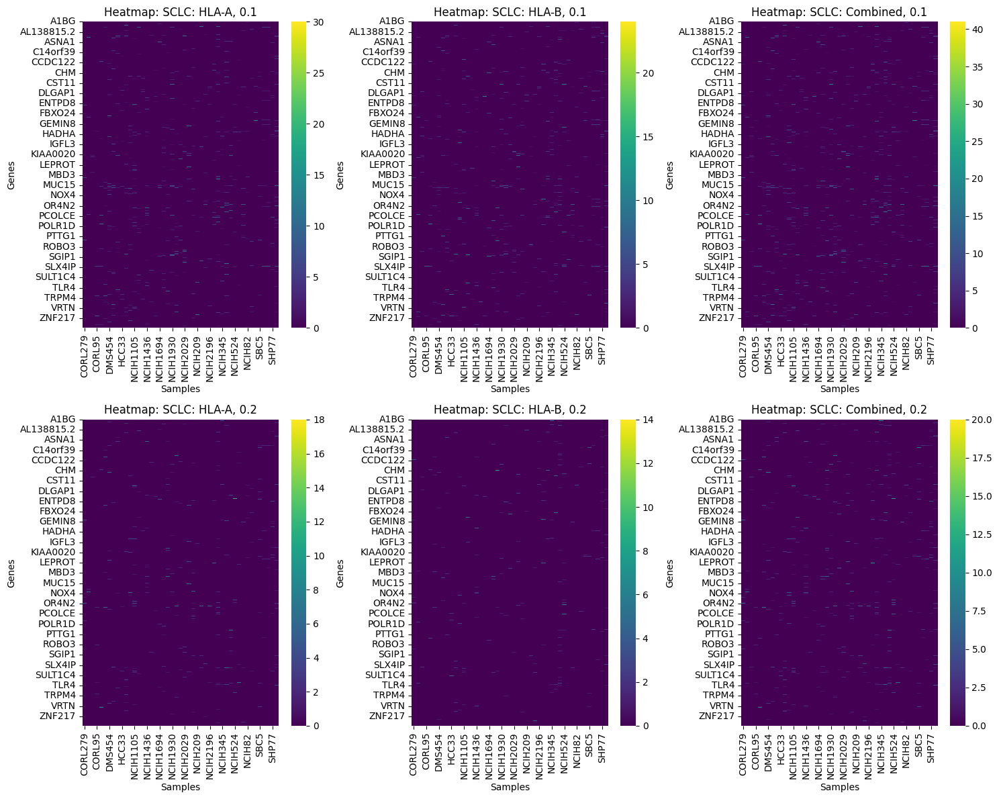

In [ ]:
n_cols = max(len(data_1), len(data_2))

fig, axes = plt.subplots(2, n_cols, figsize=(5 * n_cols, 12))

# Plot heatmaps for data_1 (binding affinity 0.1)
for idx, (data, name) in enumerate(zip(data_1, data_names_1)):
    ax = axes[0, idx]
    sns.heatmap(data.T, cmap="viridis", ax=ax)
    ax.set_title(f'Heatmap: {name}')
    ax.set_xlabel('Samples')
    ax.set_ylabel('Genes')

# Plot heatmaps for data_2 (binding affinity 0.2)
for idx, (data, name) in enumerate(zip(data_2, data_names_2)):
    ax = axes[1, idx]
    sns.heatmap(data.T, cmap="viridis", ax=ax)
    ax.set_title(f'Heatmap: {name}')
    ax.set_xlabel('Samples')
    ax.set_ylabel('Genes')

plt.tight_layout()
plt.show()


In [ ]:
# Merges on sample ID
# merged_A = data_hla_A.merge(subtype_df, left_index=True, right_index=True)
# merged_hla_A = merged.dropna(subset=["Subtype"])

# merged = data_hla_B.merge(subtype_df, left_index=True, right_index=True)
# merged_hla_B = merged.dropna(subset=["Subtype"])

# # merged = data_hla_AB.merge(subtype_df, left_index=True, right_index=True)
# # merged_hla_AB = merged.dropna(subset=["Subtype"])

# print(f"HLA-A: {merged_hla_A.shape}")
# print(f"HLA-B: {merged_hla_B.shape}")
# print(f"HLA-A and HLA-B: {merged_hla_AB.shape}")

In [ ]:
# Scale data
scaler = StandardScaler()

data_hla_A_1_scaled = scaler.fit_transform(data_hla_A_1)
data_hla_B_1_scaled = scaler.fit_transform(data_hla_B_1)
data_hla_AB_1_scaled = scaler.fit_transform(data_hla_AB_1)

data_hla_A_2_scaled = scaler.fit_transform(data_hla_A_2)
data_hla_B_2_scaled = scaler.fit_transform(data_hla_B_2)
data_hla_AB_2_scaled = scaler.fit_transform(data_hla_AB_2)


In [ ]:
# data_scaled = [data_hla_A_scaled, data_hla_B_scaled, data_hla_AB_scaled]

data_scaled_1 = [data_hla_A_1_scaled, data_hla_B_1_scaled, data_hla_AB_1_scaled]
data_scaled_2 = [data_hla_A_2_scaled, data_hla_B_2_scaled, data_hla_AB_2_scaled]

for data, name in zip(data_scaled_1, data_names_1):
  print(f"{name}: {data.shape}")
for data, name in zip(data_scaled_2, data_names_2):
  print(f"{name}: {data.shape}")

SCLC: HLA-A, 0.1: (47, 12150)
SCLC: HLA-B, 0.1: (47, 12150)
SCLC: Combined, 0.1: (47, 12150)
SCLC: HLA-A, 0.2: (47, 12150)
SCLC: HLA-B, 0.2: (47, 12150)
SCLC: Combined, 0.2: (47, 12150)


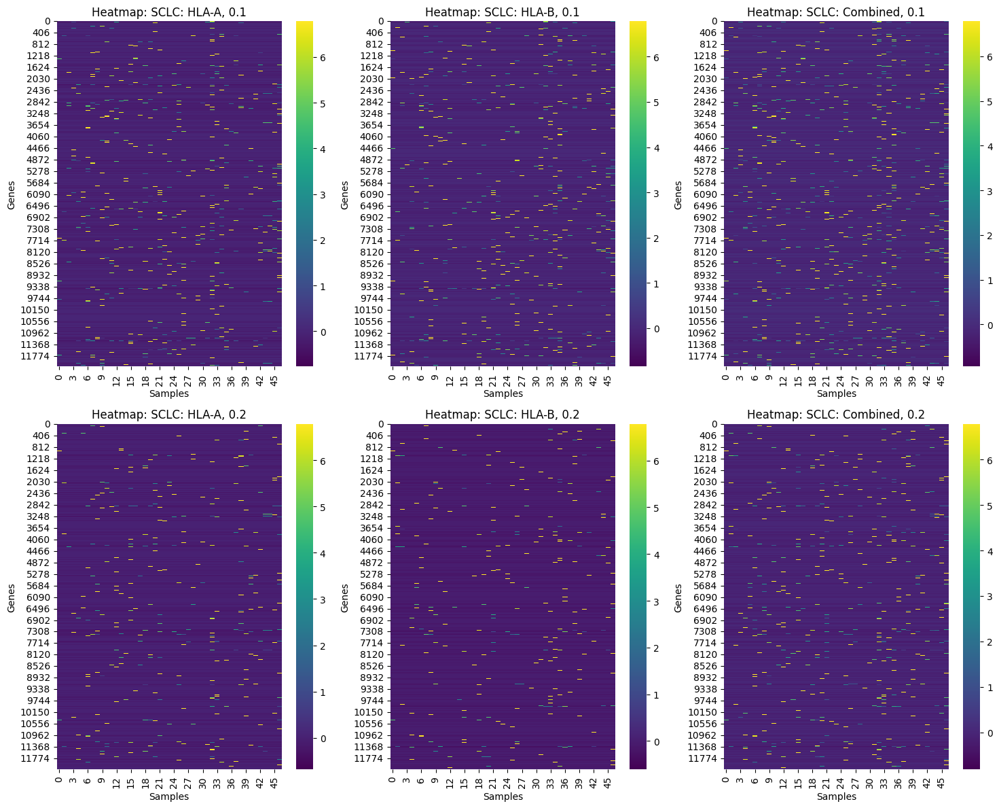

In [ ]:
n_cols = max(len(data_scaled_1), len(data_scaled_2))

fig, axes = plt.subplots(2, n_cols, figsize=(5 * n_cols, 12))

# Plot heatmaps for data_1 (binding affinity 0.1)
for idx, (data, name) in enumerate(zip(data_scaled_1, data_names_1)):
    ax = axes[0, idx]
    sns.heatmap(data.T, cmap="viridis", ax=ax)
    ax.set_title(f'Heatmap: {name}')
    ax.set_xlabel('Samples')
    ax.set_ylabel('Genes')

# Plot heatmaps for data_2 (binding affinity 0.2)
for idx, (data, name) in enumerate(zip(data_scaled_2, data_names_2)):
    ax = axes[1, idx]
    sns.heatmap(data.T, cmap="viridis", ax=ax)
    ax.set_title(f'Heatmap: {name}')
    ax.set_xlabel('Samples')
    ax.set_ylabel('Genes')

plt.tight_layout()
plt.show()

#### Clustering: K-Means and DBSCAN

In [ ]:
# merged_hla_A_scaled = scaler.fit_transform(merged_hla_A.drop(columns=["Subtype"]))
# merged_hla_B_scaled = scaler.fit_transform(merged_hla_B.drop(columns=["Subtype"]))
# merged_hla_AB_scaled = scaler.fit_transform(merged_hla_AB.drop(columns=["Subtype"]))

# merged_scaled = [merged_hla_A_scaled, merged_hla_B_scaled, merged_hla_AB_scaled]

# for data, name in zip(merged_scaled, data_names):
#   print(f"{name}: {data.shape}")

In [ ]:
# K-Means Clustering
def kmeans(name, X_scaled, k=None):
  scores_list = []
  labels_list = []

  if k is None:
    ks = range(2,11)
  elif k.dtype == int:
    ks = [k]

  print(f'{name} - K-Means:')

  for k in ks:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)
    scores_list.append(sil)
    labels_list.append(labels)

    print(f'\tk = {k}, Silhouette Score: {sil}')

  return labels_list, scores_list, ks

In [ ]:
# DBSCAN Clustering
def dbscan(name, X_scaled):
  dbscan = DBSCAN(eps=0.5, min_samples=5)
  dbscan_labels = dbscan.fit_predict(X_scaled)

  # Silhouette score
  dbscan_valid = dbscan_labels != -1
  if np.unique(dbscan_labels[dbscan_valid]).size > 1:
      dbscan_sil = silhouette_score(X_scaled[dbscan_valid], dbscan_labels[dbscan_valid])
  else:
      dbscan_sil = np.nan

  print(f"{name} - DBSCAN Silhouette Score: {dbscan_sil if not np.isnan(dbscan_sil) else 'Not computable (only one cluster)'}")

  return dbscan_labels, dbscan_sil

In [ ]:
def generate_plots(name, kmeans_labels_list, kmeans_scores_list, ks, dbscan_labels, X_pca, X_scaled):
    """
    Generate separate figures for:
    - DBSCAN (single figure)
    - Each K-means label-score pair (each in a figure with PCA and UMAP side by side)
    """
    # DBSCAN plot
    plt.figure(figsize=(7, 5))
    sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=dbscan_labels, palette='Set1')
    plt.title("DBSCAN (PCA Projection)")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend(title="Cluster", loc='best')
    plt.tight_layout()
    plt.show()

    # K-means plots (PCA and UMAP side by side for each pair)
    for idx, (kmeans_labels, kmeans_score) in enumerate(zip(kmeans_labels_list, kmeans_scores_list)):
        plt.figure(figsize=(14, 5))  # Wider for side-by-side subplots

        # PCA Projection
        plt.subplot(1, 2, 1)
        sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=kmeans_labels, palette='Set2')
        plt.title(f"K-means (PCA Projection)\nSilhouette Score: {kmeans_score:.2f}")
        plt.xlabel("PCA 1")
        plt.ylabel("PCA 2")
        plt.legend(title="Cluster", loc='best')

        # UMAP Projection
        plt.subplot(1, 2, 2)
        umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
        X_umap = umap_model.fit_transform(X_scaled)
        sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], hue=kmeans_labels, palette='Set2')
        plt.title("UMAP Projection with K-means Clusters")
        plt.xlabel("UMAP 1")
        plt.ylabel("UMAP 2")
        plt.legend(title="Cluster", loc='best')

        # Super-title for context
        plt.suptitle(f"{name} - K-means Clustering Visualization (k = {ks[idx]})", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 1])
        plt.show()


HLA-A - K-Means:
	k = 2, Silhouette Score: 0.14265903323844403
	k = 3, Silhouette Score: 0.016736599691312633
	k = 4, Silhouette Score: 0.025051630016633946
	k = 5, Silhouette Score: 0.03184276456962463
	k = 6, Silhouette Score: 0.0351366058346894
	k = 7, Silhouette Score: 0.03584782403335302
	k = 8, Silhouette Score: 0.03591801326379512
	k = 9, Silhouette Score: 0.03722330846937506
	k = 10, Silhouette Score: 0.04441926763698623
HLA-A - DBSCAN Silhouette Score: Not computable (only one cluster)


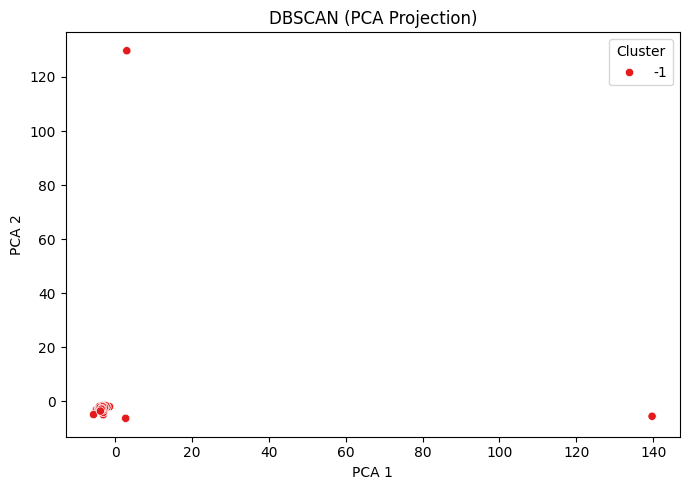

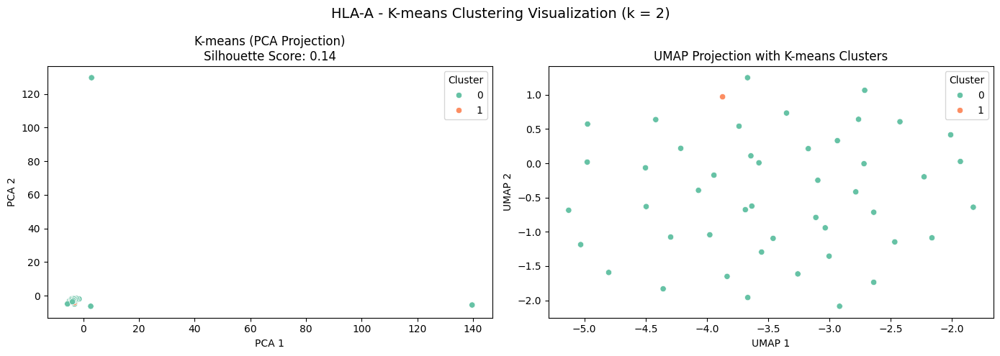

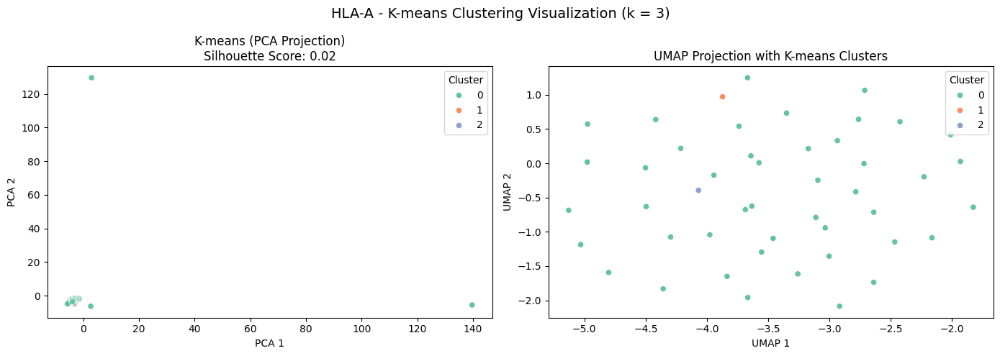

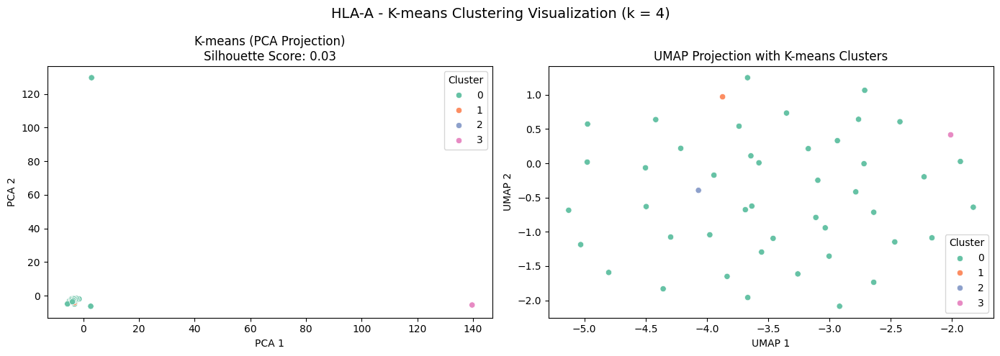

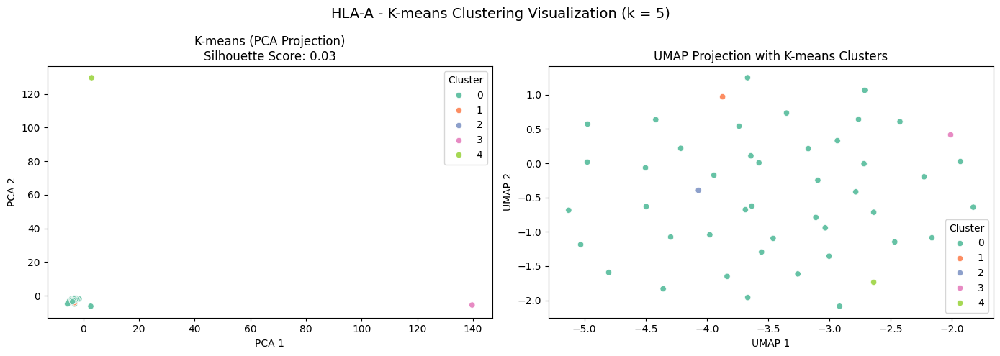

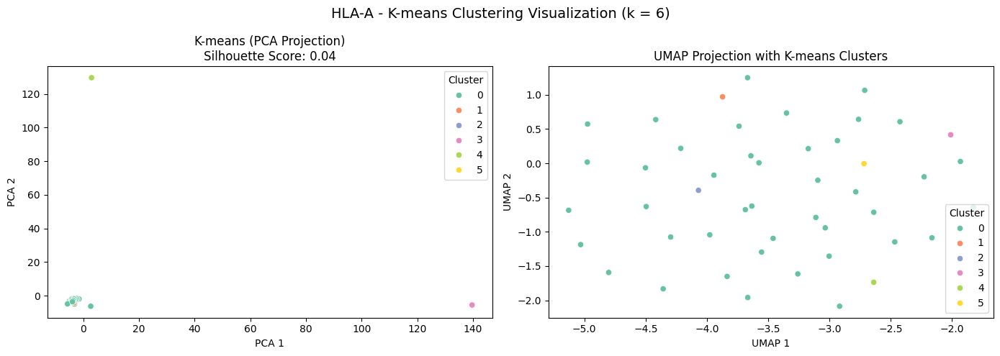

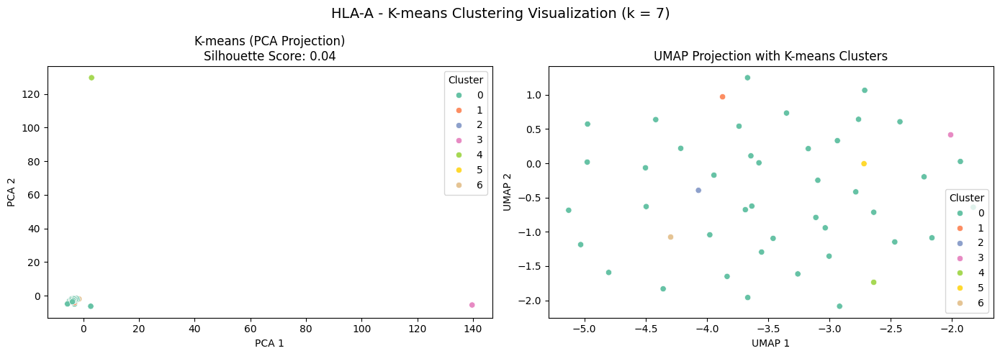

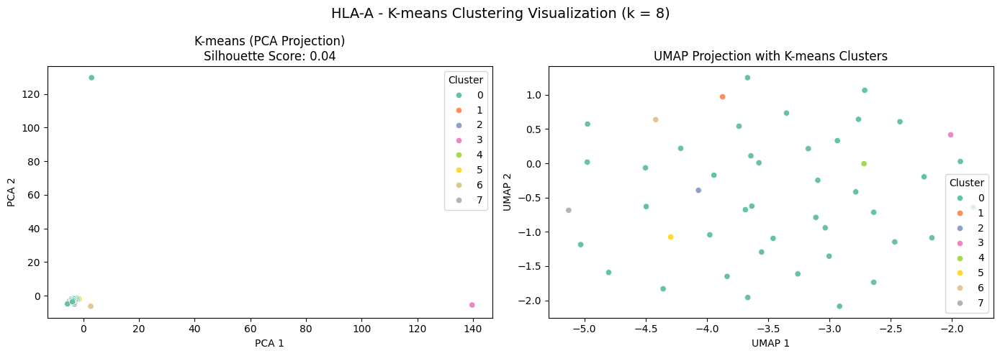

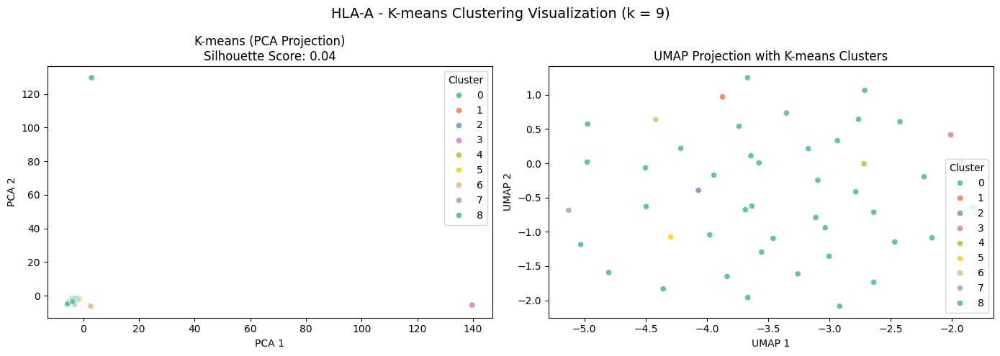

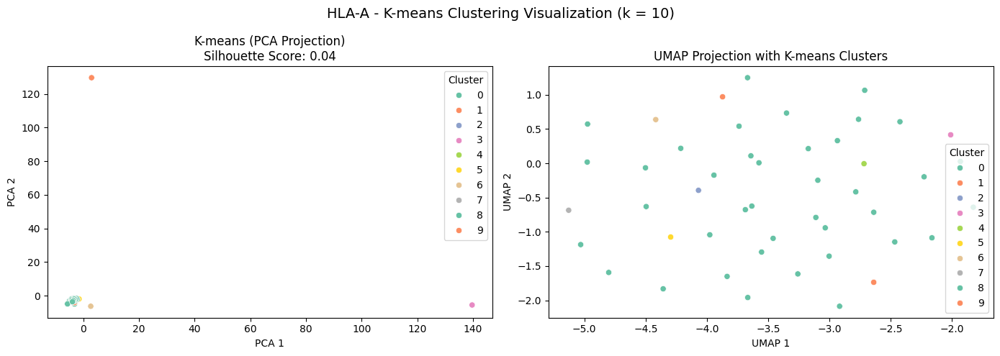

In [ ]:
### Perform analyses and generate plots for each dataset ##

# HLA-A binders, 0.1
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A', data_hla_A_1_scaled, k=None)
dbscan_labels_A1, dbscan_sil_A1 = dbscan('HLA-A', data_hla_A_1_scaled)
pca_A1 = PCA(n_components=2)
X_pca_A1 = pca_A1.fit_transform(data_hla_A_1_scaled)
generate_plots('HLA-A', kmeans_labels_A1, kmeans_sil_A1, ks, dbscan_labels_A1, X_pca_A1, data_hla_A_1_scaled)

HLA-A - K-Means:
	k = 2, Silhouette Score: 0.1466433113505943
	k = 3, Silhouette Score: 0.015162350667705105
	k = 4, Silhouette Score: -0.14733121122231876
	k = 5, Silhouette Score: -0.13911946269749273
	k = 6, Silhouette Score: -0.13384715081317364
	k = 7, Silhouette Score: -0.12710113580344654
	k = 8, Silhouette Score: -0.11569839883167397
	k = 9, Silhouette Score: -0.14252038686090315
	k = 10, Silhouette Score: -0.13333461530920176
HLA-A - DBSCAN Silhouette Score: Not computable (only one cluster)


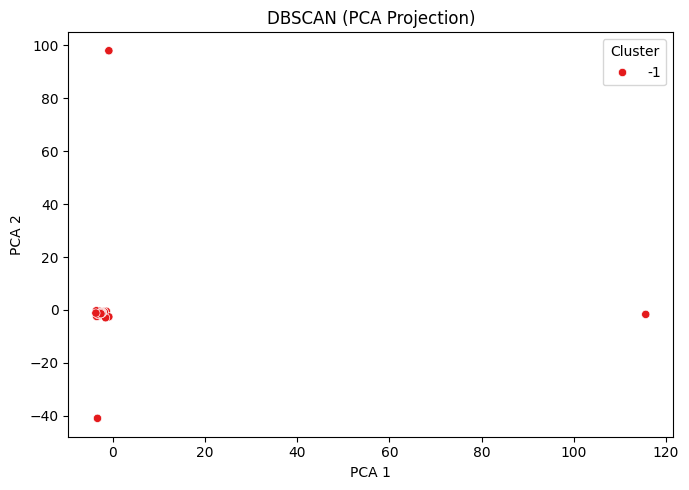

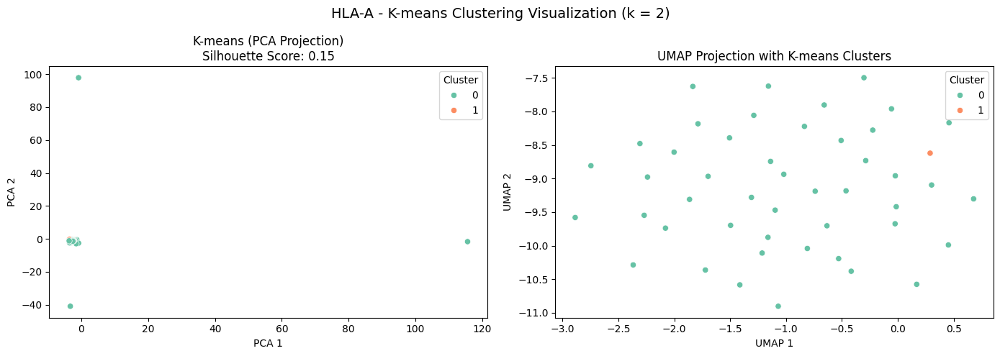

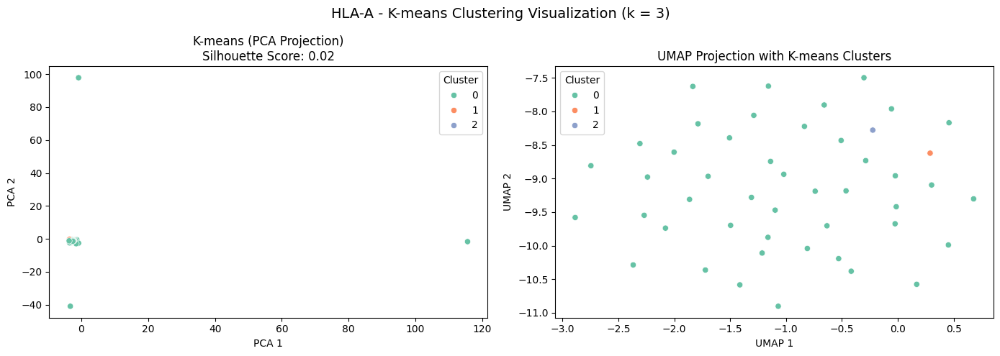

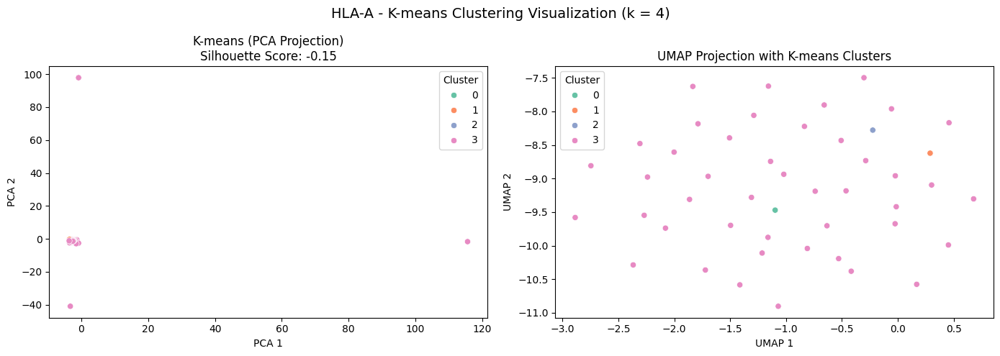

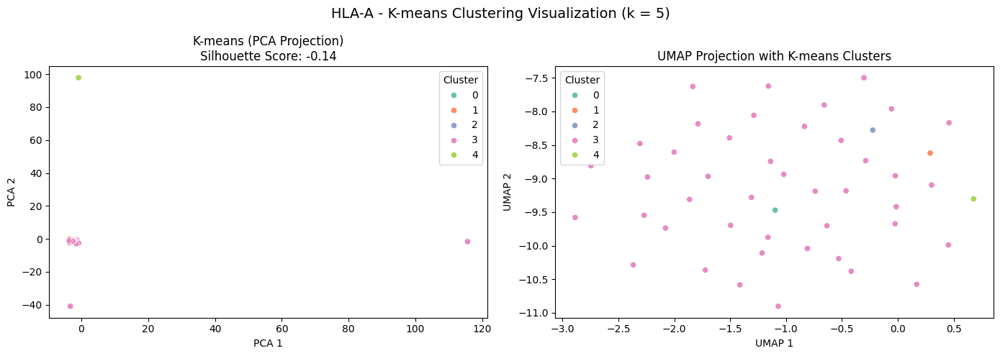

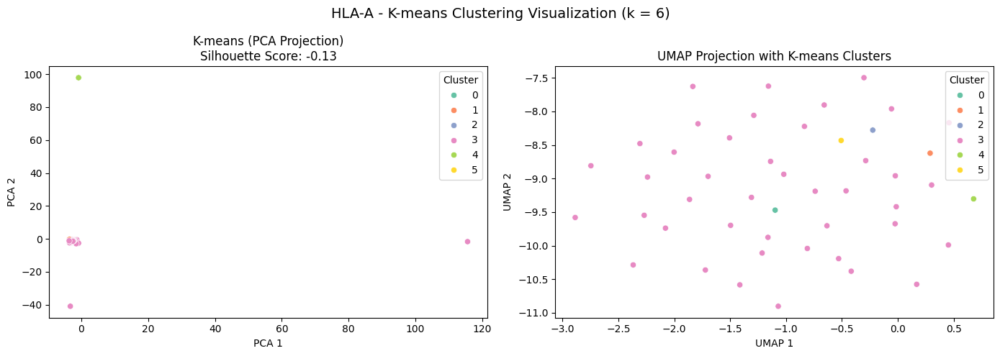

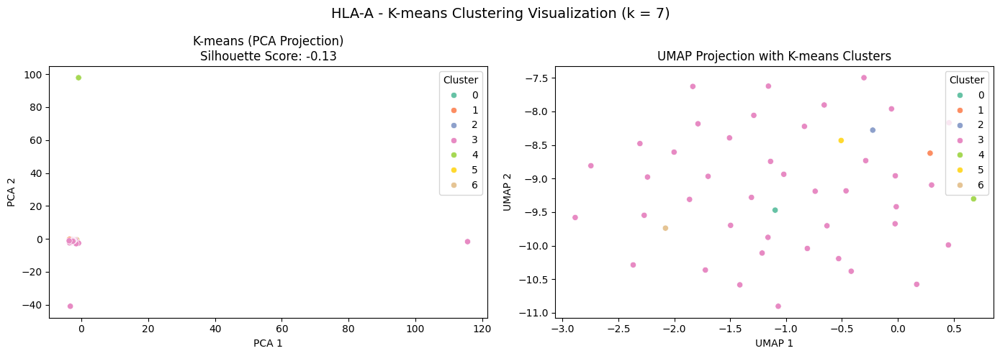

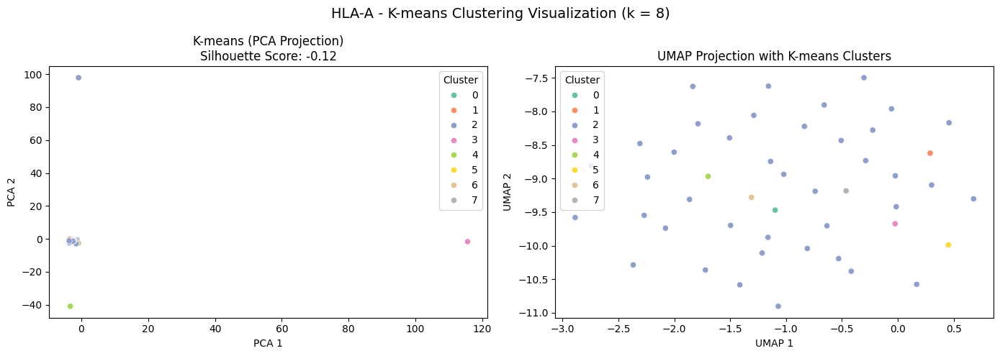

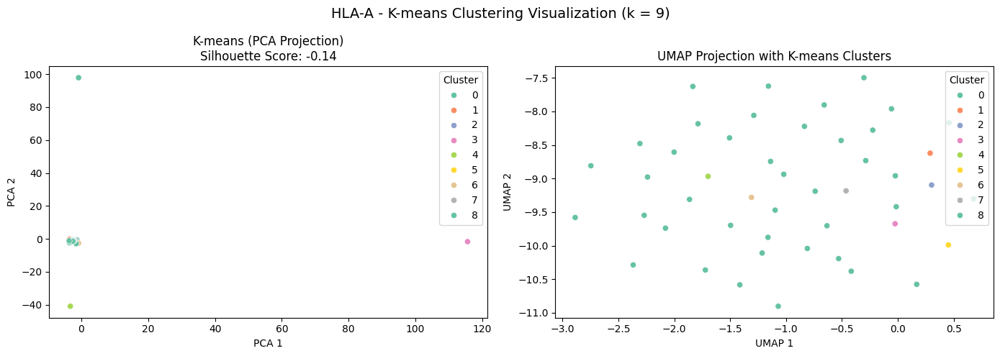

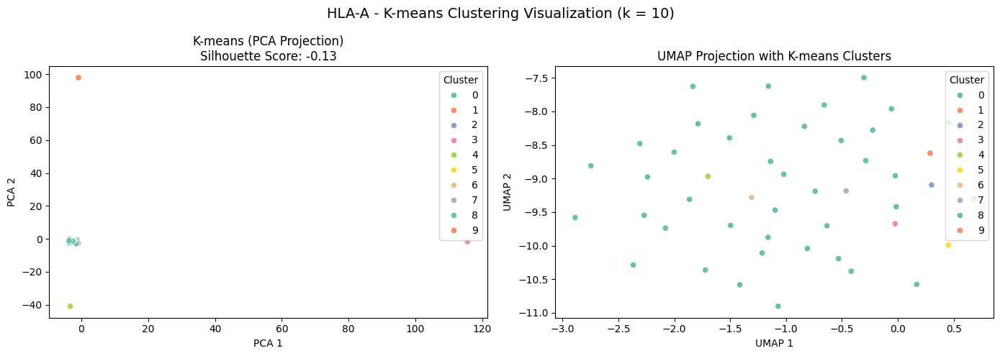

In [ ]:
# HLA-A binders, 0.2
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A', data_hla_A_2_scaled, k=None)
dbscan_labels_A2, dbscan_sil_A2 = dbscan('HLA-A', data_hla_A_2_scaled)
pca_A2 = PCA(n_components=2)
X_pca_A2 = pca_A2.fit_transform(data_hla_A_2_scaled)
generate_plots('HLA-A', kmeans_labels_A2, kmeans_sil_A2, ks, dbscan_labels_A2, X_pca_A2, data_hla_A_2_scaled)

HLA-B - K-Means:
	k = 2, Silhouette Score: 0.2625327711970007
	k = 3, Silhouette Score: -0.13790004379518045
	k = 4, Silhouette Score: -0.1333964801764284
	k = 5, Silhouette Score: -0.12603856942174146
	k = 6, Silhouette Score: -0.12292686837069944
	k = 7, Silhouette Score: -0.11543314823052776
	k = 8, Silhouette Score: -0.10820274974017434
	k = 9, Silhouette Score: -0.10409119567042602
	k = 10, Silhouette Score: -0.0996456669027549
HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


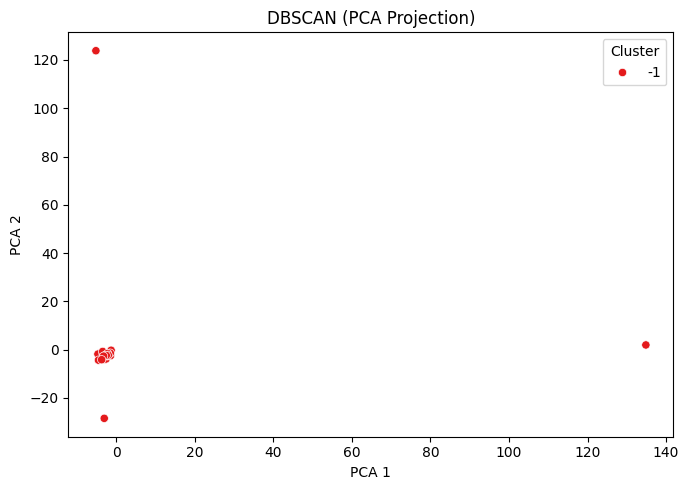

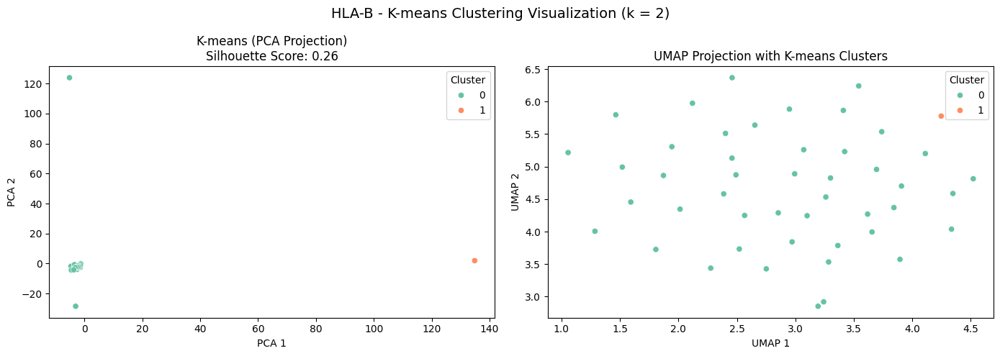

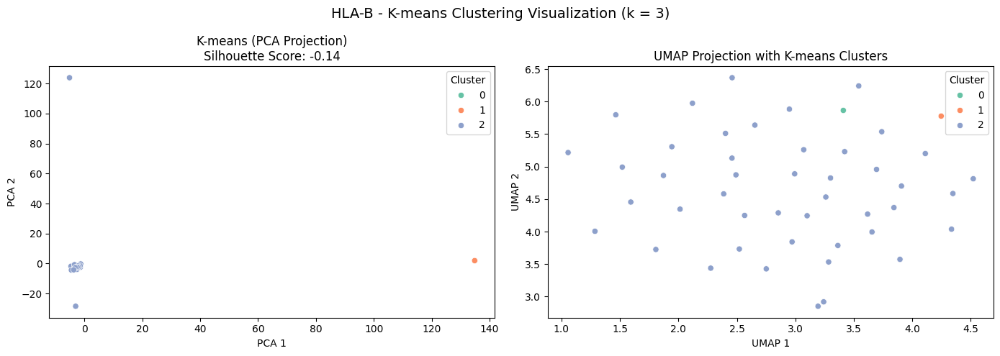

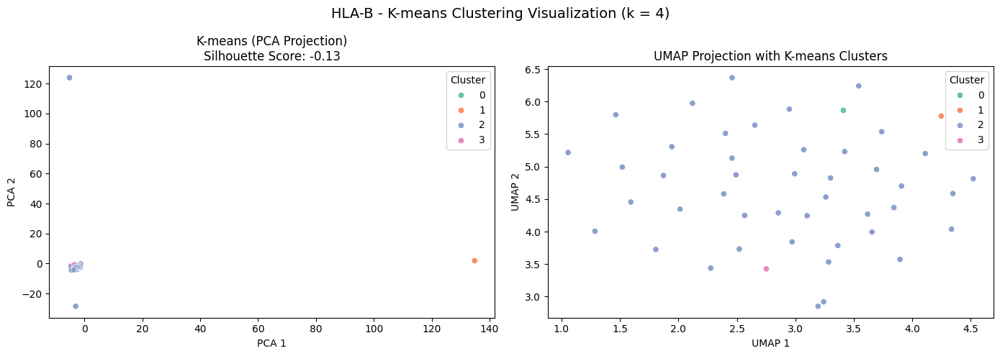

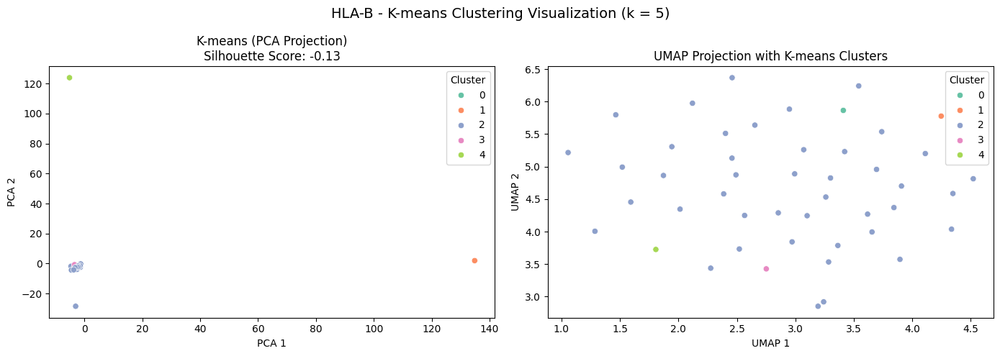

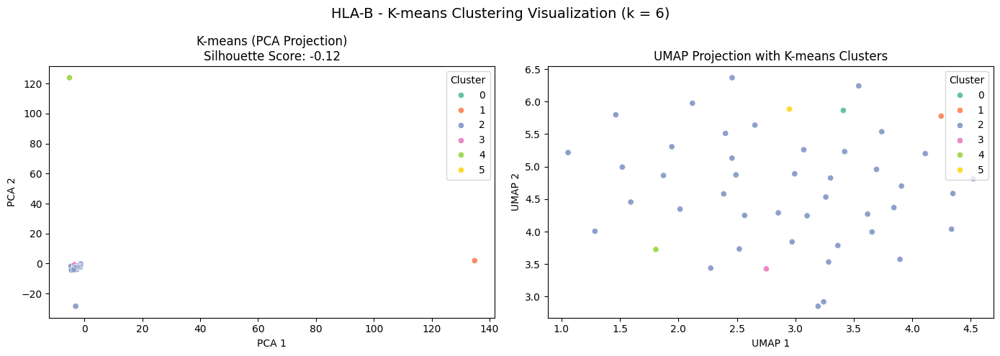

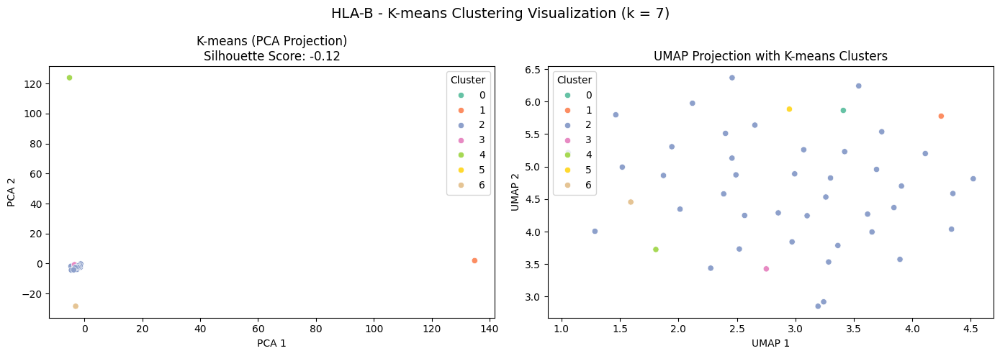

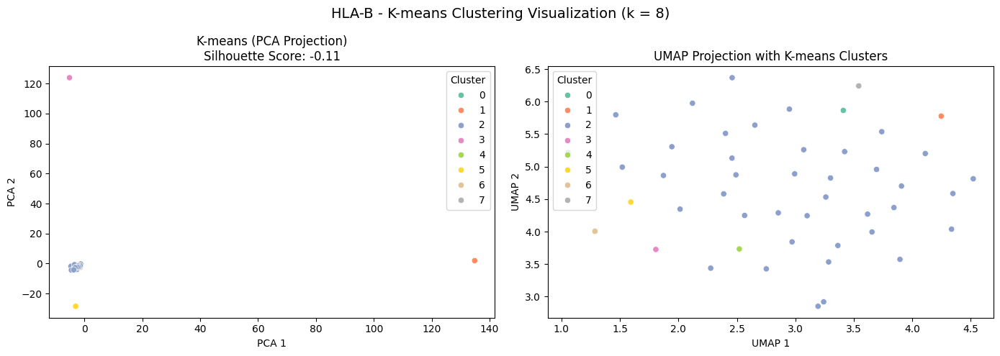

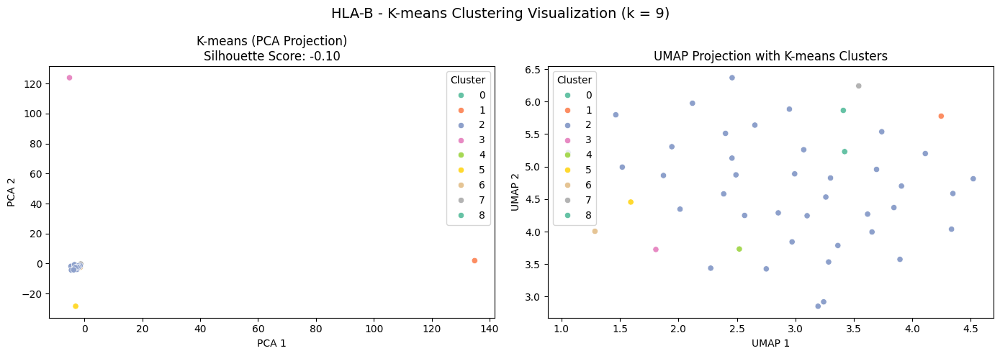

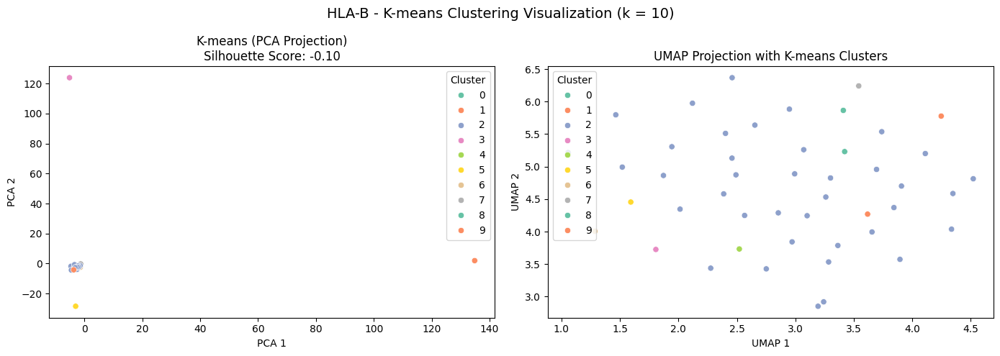

In [ ]:
# HLA-B binders, 0.1
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B', data_hla_B_1_scaled, k=None)
dbscan_labels_B1, dbscan_sil_B1 = dbscan('HLA-B', data_hla_B_1_scaled)
pca_B1 = PCA(n_components=2)
X_pca_B1 = pca_B1.fit_transform(data_hla_B_1_scaled)
generate_plots('HLA-B', kmeans_labels_B1, kmeans_sil_B1, ks, dbscan_labels_B1, X_pca_B1, data_hla_B_1_scaled)

HLA-B - K-Means:
	k = 2, Silhouette Score: 0.30525064974399657
	k = 3, Silhouette Score: -0.1214327003984465
	k = 4, Silhouette Score: -0.11621616601379814
	k = 5, Silhouette Score: -0.10909483054461311
	k = 6, Silhouette Score: -0.1072373805331639
	k = 7, Silhouette Score: -0.0985467537936546
	k = 8, Silhouette Score: -0.09230886685695917
	k = 9, Silhouette Score: -0.08785406073611039
	k = 10, Silhouette Score: -0.08326463149339113
HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


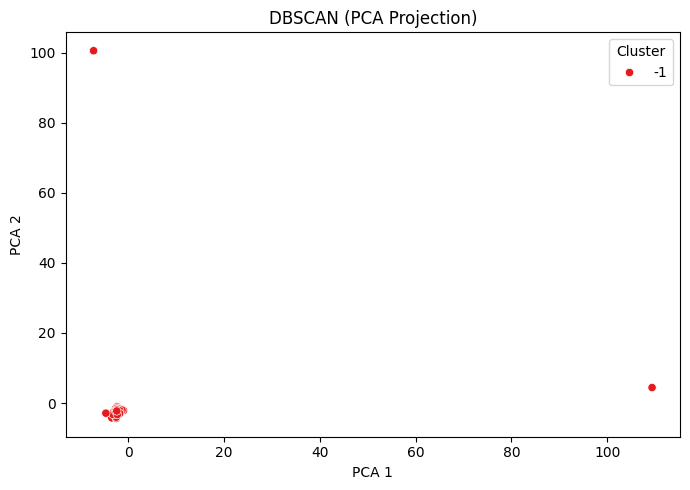

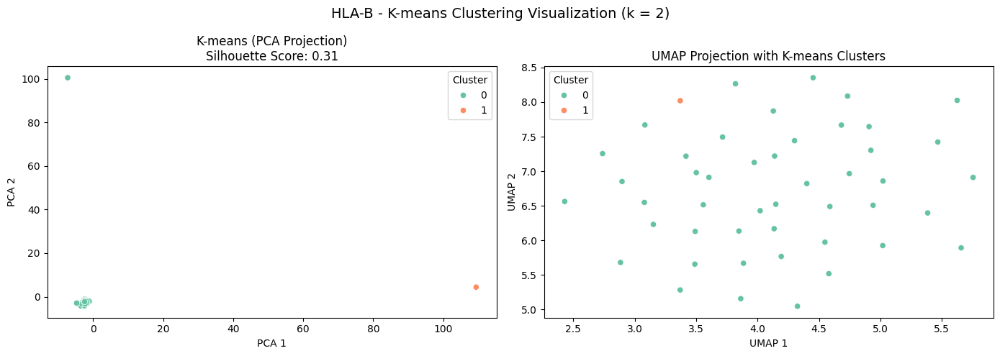

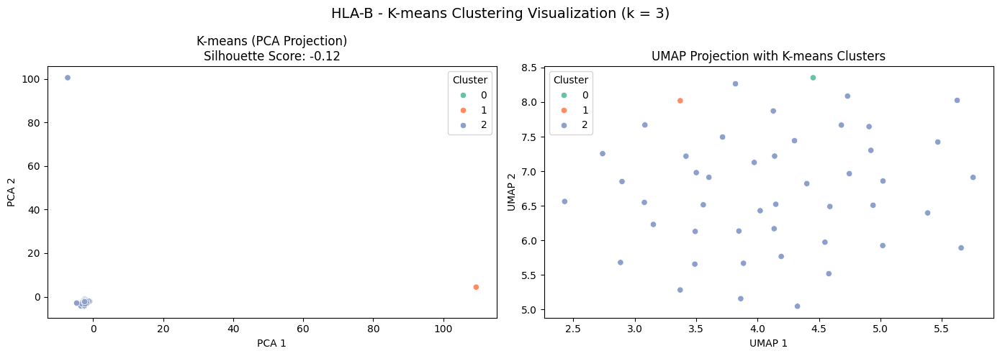

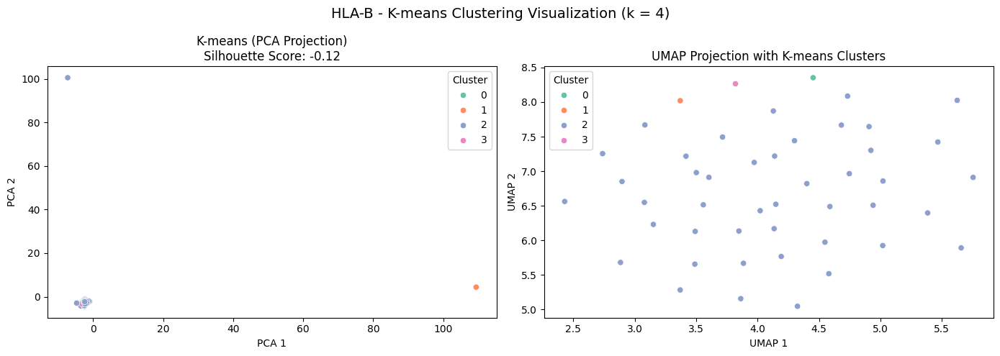

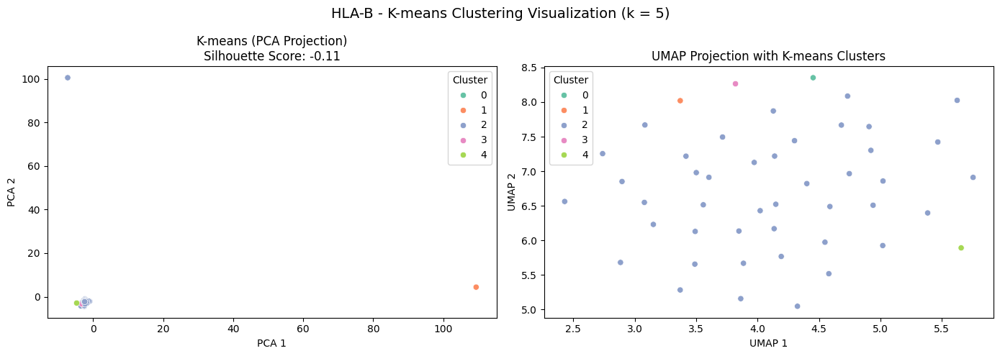

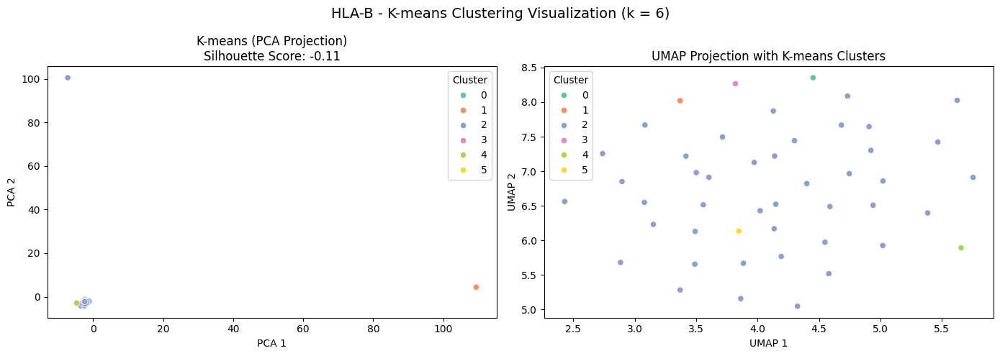

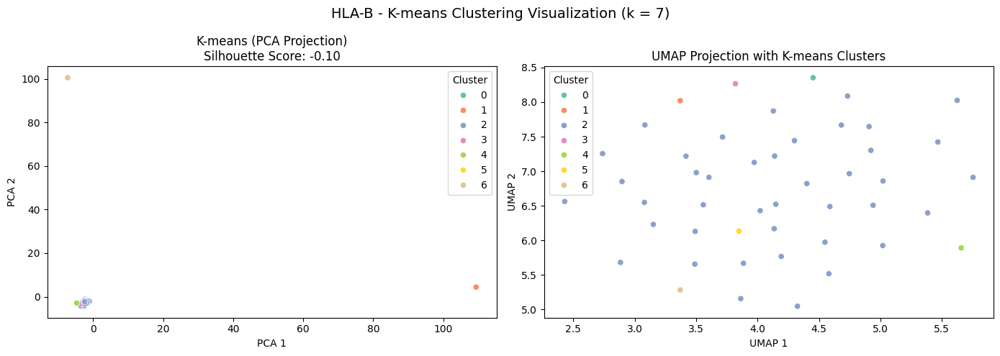

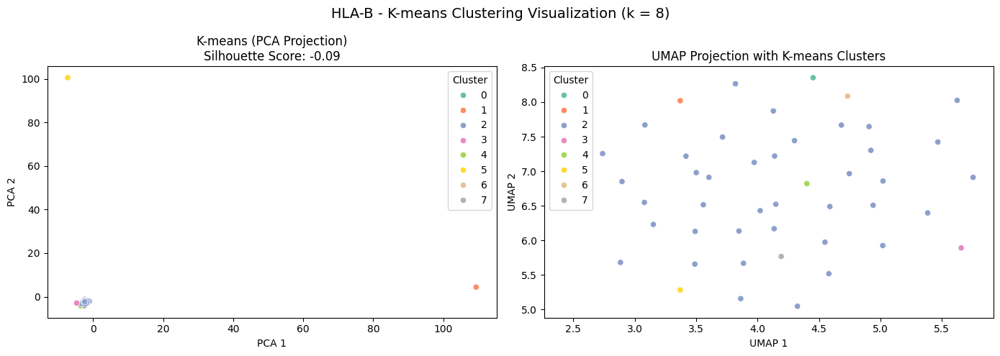

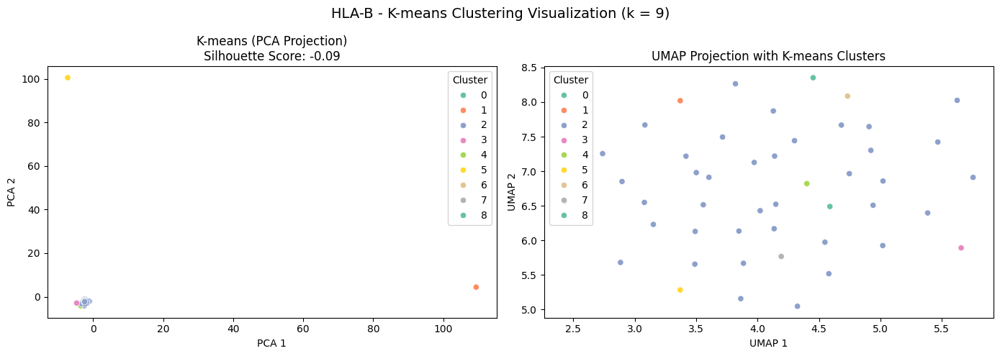

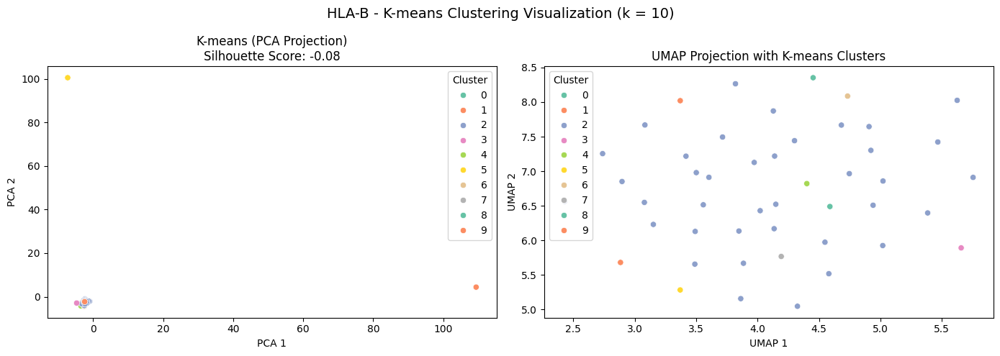

In [ ]:
# HLA-B binders, 0.2
kmeans_labels_B2, kmeans_sil_B2, ks  = kmeans('HLA-B', data_hla_B_2_scaled, k=None)
dbscan_labels_B2, dbscan_sil_B2 = dbscan('HLA-B', data_hla_B_2_scaled)
pca_B2 = PCA(n_components=2)
X_pca_B2 = pca_B2.fit_transform(data_hla_B_2_scaled)
generate_plots('HLA-B', kmeans_labels_B2, kmeans_sil_B2, ks, dbscan_labels_B2, X_pca_B2, data_hla_B_2_scaled)

HLA-A and HLA-B - K-Means:
	k = 2, Silhouette Score: 0.15699493705201956
	k = 3, Silhouette Score: 0.02998491860864251
	k = 4, Silhouette Score: 0.03141359207779648
	k = 5, Silhouette Score: 0.03724843134181831
	k = 6, Silhouette Score: 0.0390285246347204
	k = 7, Silhouette Score: 0.04386390334447897
	k = 8, Silhouette Score: -0.12626248392313347
	k = 9, Silhouette Score: -0.12163289011050243
	k = 10, Silhouette Score: -0.1164670586140452
HLA-A and HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


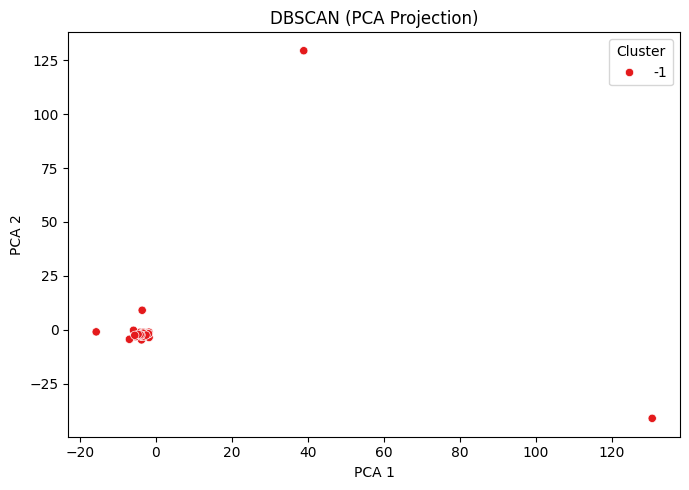

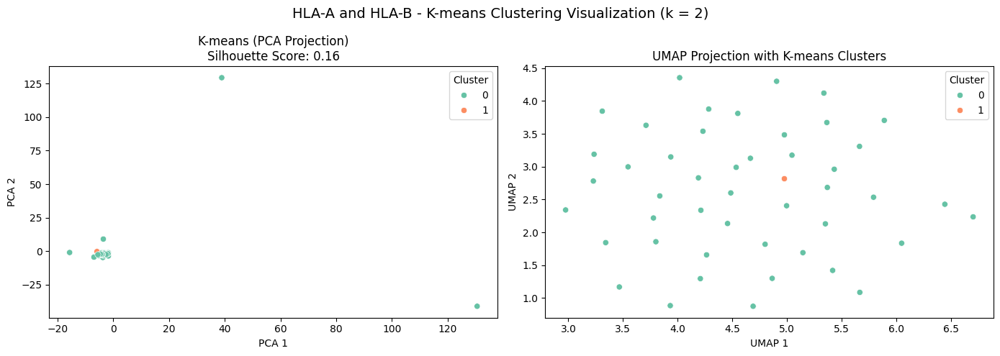

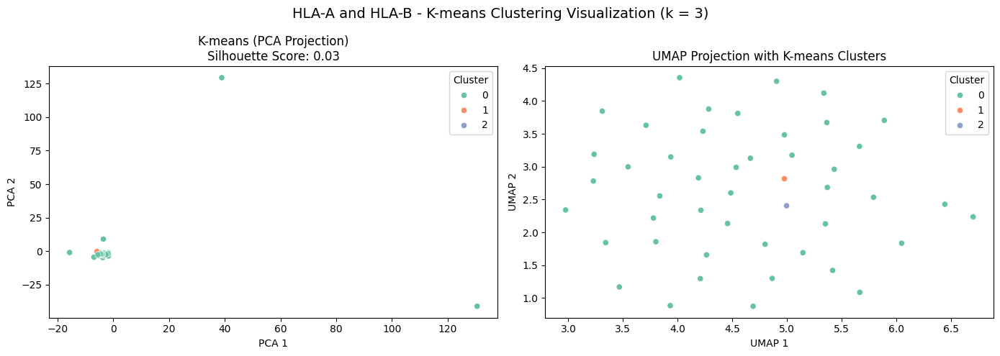

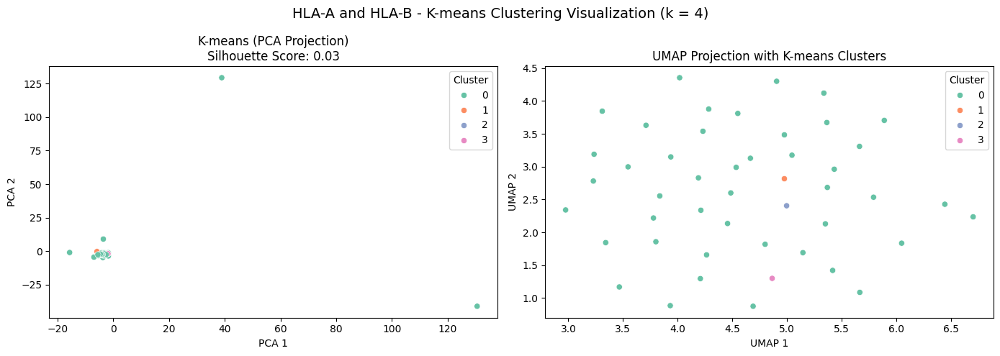

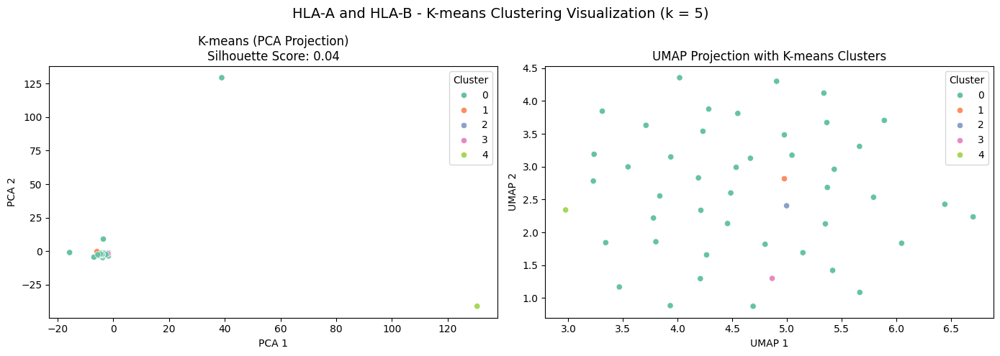

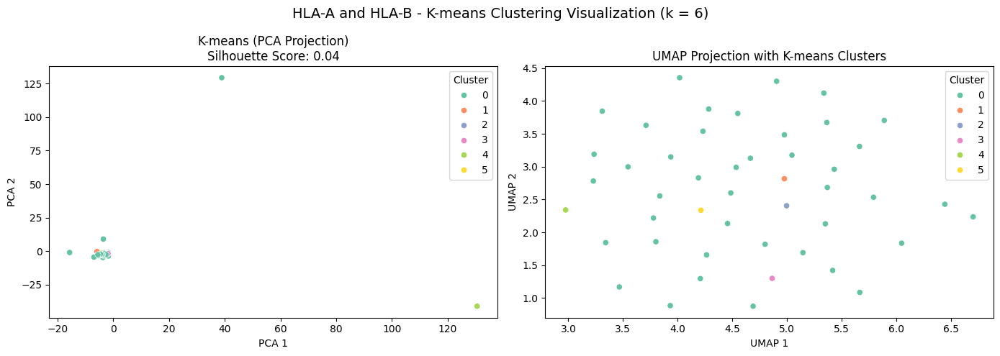

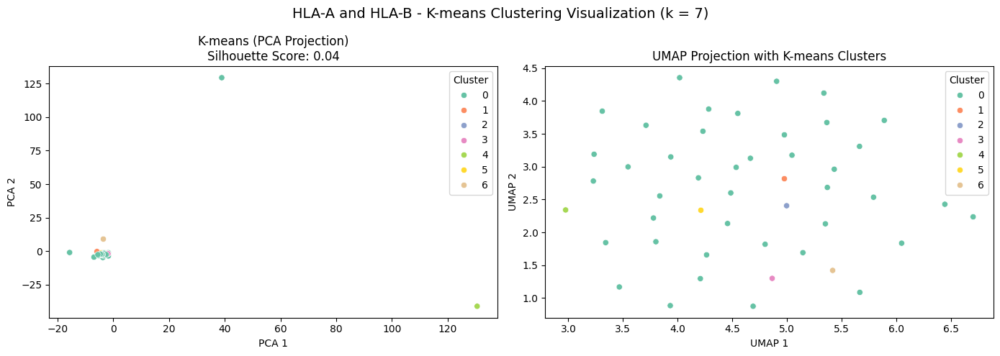

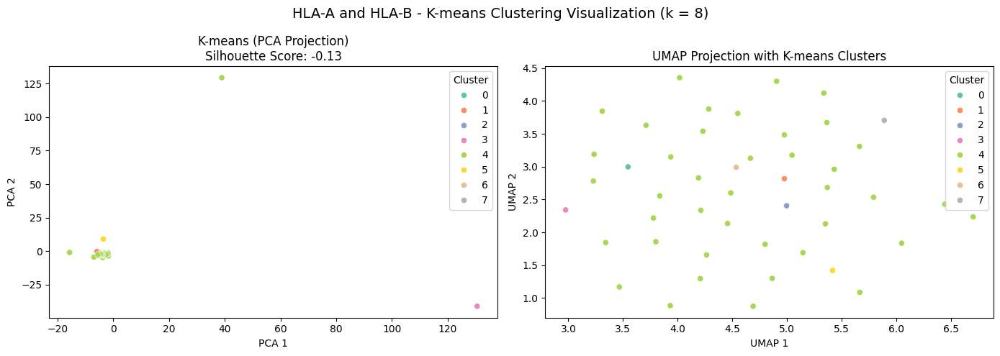

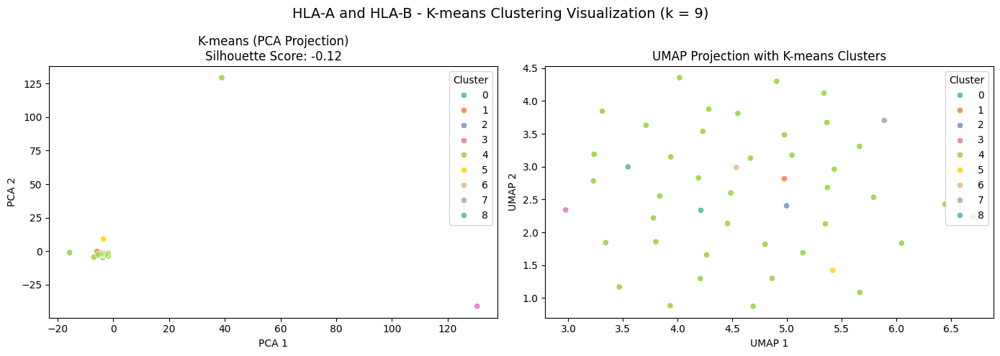

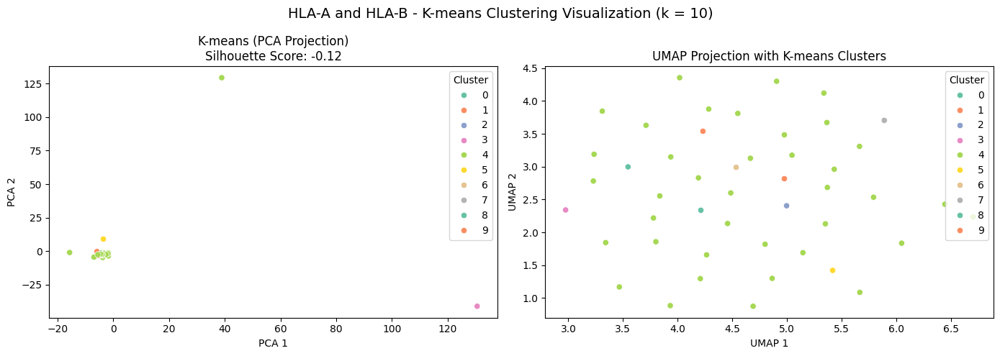

In [ ]:
# Both HLA-A and HLA-B binders, 0.1
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B', data_hla_AB_1_scaled, k=None)
dbscan_labels_AB1, dbscan_sil_AB1 = dbscan('HLA-A and HLA-B', data_hla_AB_1_scaled)
pca_AB1 = PCA(n_components=2)
X_pca_AB1 = pca_AB1.fit_transform(data_hla_AB_1_scaled)
generate_plots('HLA-A and HLA-B', kmeans_labels_AB1, kmeans_sil_AB1, ks, dbscan_labels_AB1, X_pca_AB1, data_hla_AB_1_scaled)

HLA-A and HLA-B - K-Means:
	k = 2, Silhouette Score: 0.1548706607250349
	k = 3, Silhouette Score: 0.03128434857818163
	k = 4, Silhouette Score: 0.033117541057128164
	k = 5, Silhouette Score: 0.0398476783852079
	k = 6, Silhouette Score: 0.04081823276578704
	k = 7, Silhouette Score: 0.04489156762173749
	k = 8, Silhouette Score: 0.04994565916184667
	k = 9, Silhouette Score: -0.10582339028636797
	k = 10, Silhouette Score: -0.1012961179345675
HLA-A and HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


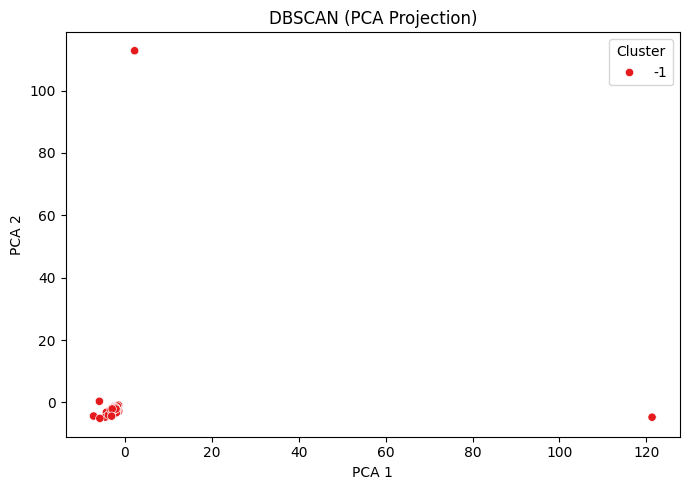

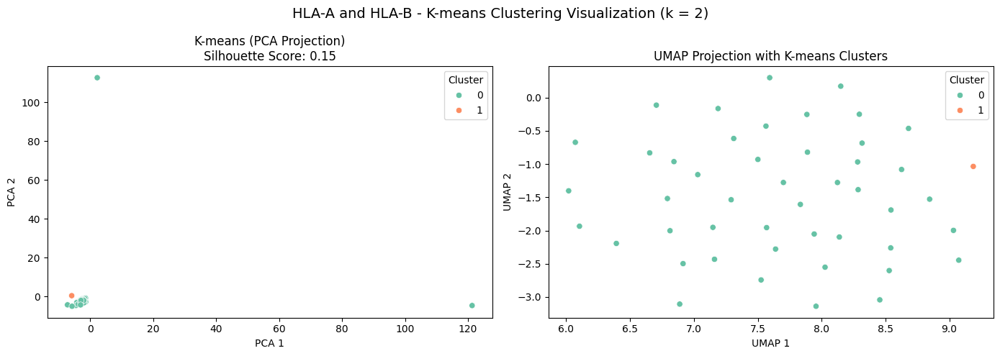

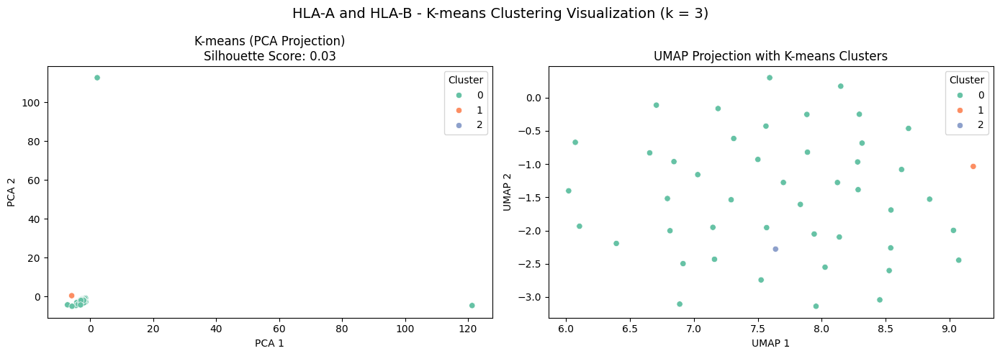

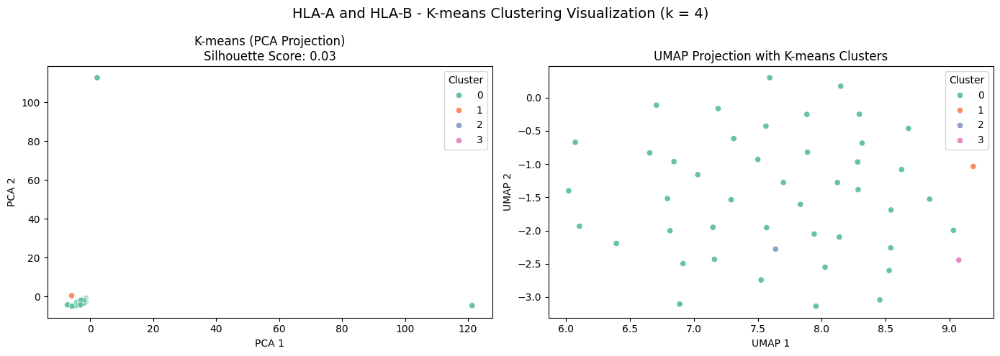

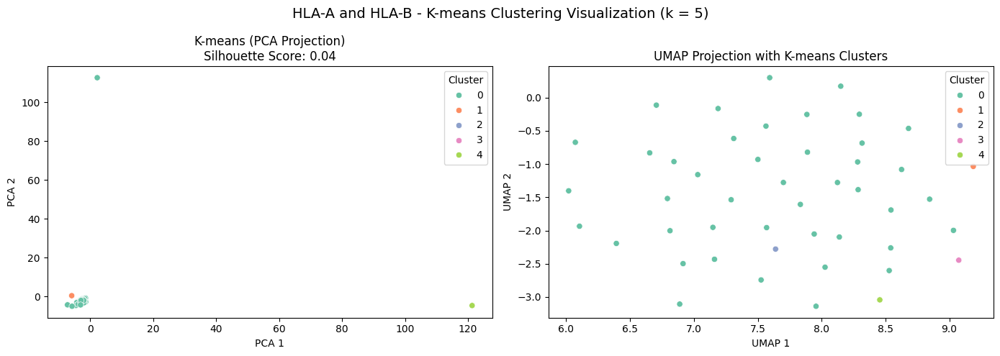

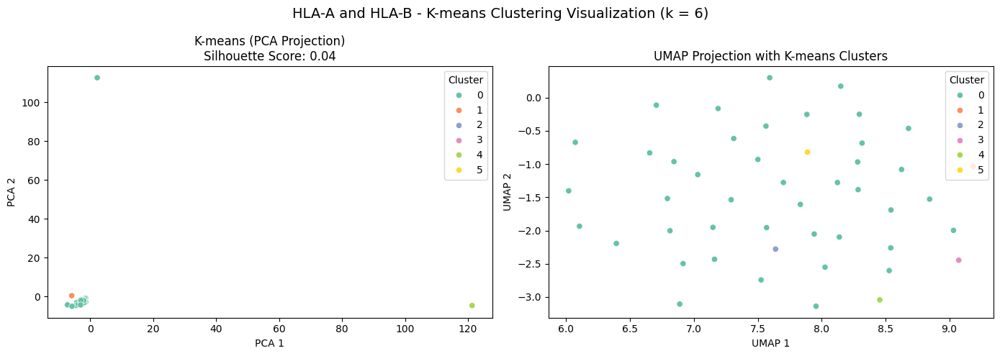

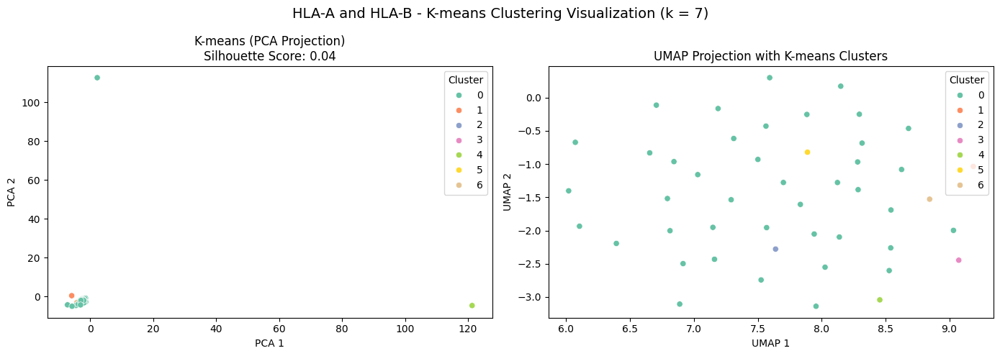

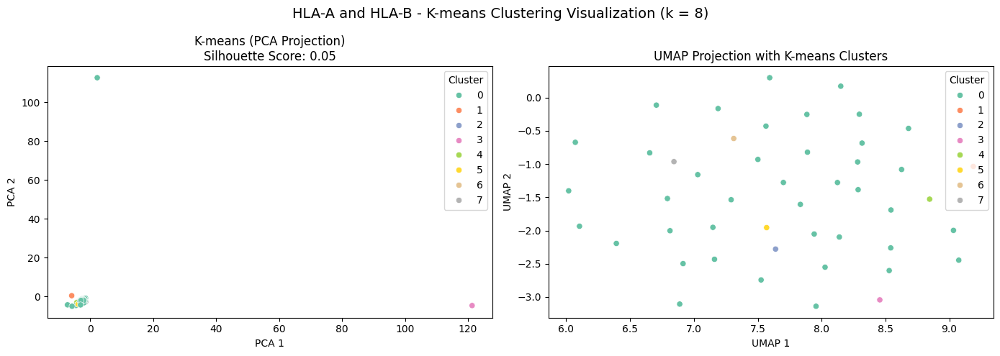

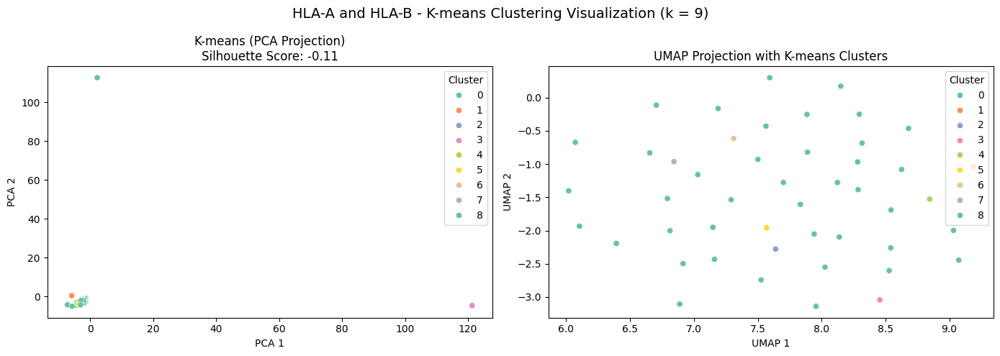

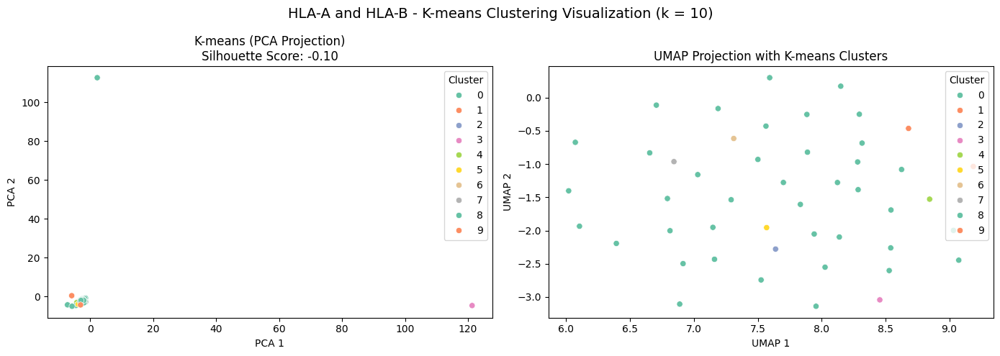

In [ ]:
# Both HLA-A and HLA-B binders, 0.2
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B', data_hla_AB_2_scaled, k=None)
dbscan_labels_AB2, dbscan_sil_AB2 = dbscan('HLA-A and HLA-B', data_hla_AB_2_scaled)
pca_AB2 = PCA(n_components=2)
X_pca_AB2 = pca_AB2.fit_transform(data_hla_AB_2_scaled)
generate_plots('HLA-A and HLA-B', kmeans_labels_AB2, kmeans_sil_AB2, ks, dbscan_labels_AB2, X_pca_AB2, data_hla_AB_2_scaled)

#### PCA before Clustering

In [ ]:
def kmeans(name, X_scaled, k=None, n_components=50):
  scores_list = []
  labels_list = []

  # Apply PCA to reduce noise before clustering
  pca = PCA(n_components=n_components, random_state=42)
  X_pca = pca.fit_transform(X_scaled)
  # print(f'{name} - PCA shape: {X_pca.shape}')

  if k is None:
    ks = range(2, 11)
  elif isinstance(k, int):
    ks = [k]

  # print(f'{name} - K-Means after PCA:')

  for k_val in ks:
    kmeans = KMeans(n_clusters=k_val, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    sil = silhouette_score(X_pca, labels)
    scores_list.append(sil)
    labels_list.append(labels)

    # print(f'\tk = {k_val}, Silhouette Score: {sil}')

  return labels_list, scores_list, ks


In [ ]:
def plot_kmeans_scores_projections(data_dict, n_components, kmeans_sil_list_1, kmeans_sil_list_2, ks):
    kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1 = kmeans_sil_list_1
    kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2 = kmeans_sil_list_2

    # Plot silhouette scores vs k
    plt.figure(figsize=(10, 6))
    plt.plot(ks, kmeans_sil_A1, marker='o', label='HLA-A, limit 0.1')
    plt.plot(ks, kmeans_sil_B1, marker='o', label='HLA-B, limit 0.1')
    plt.plot(ks, kmeans_sil_AB1, marker='o', label='HLA-A and HLA-B, limit 0.1')
    plt.plot(ks, kmeans_sil_A2, marker='o', linestyle='--', label='HLA-A, limit 0.2')
    plt.plot(ks, kmeans_sil_B2, marker='o', linestyle='--', label='HLA-B, limit 0.2')
    plt.plot(ks, kmeans_sil_AB2, marker='o', linestyle='--', label='HLA-A and HLA-B, limit 0.2')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Mean Silhouette Score')
    plt.title(f'SCLC: Mean Silhouette Scores by k (PCA n_components = {n_components})')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(3, 6, figsize=(24, 12))
    groups = [
        ('HLA-A, 0.1', kmeans_sil_A1, data_dict['HLA-A_0.1']),
        ('HLA-B, 0.1', kmeans_sil_B1, data_dict['HLA-B_0.1']),
        ('HLA-A and HLA-B, 0.1', kmeans_sil_AB1, data_dict['HLA-AB_0.1']),
        ('HLA-A, 0.2', kmeans_sil_A2, data_dict['HLA-A_0.2']),
        ('HLA-B, 0.2', kmeans_sil_B2, data_dict['HLA-B_0.2']),
        ('HLA-A and HLA-B, 0.2', kmeans_sil_AB2, data_dict['HLA-AB_0.2'])
    ]

    projection_methods = {
        'PCA': PCA(n_components=2),
        'UMAP': umap.UMAP(n_components=2, random_state=0),
        't-SNE': TSNE(n_components=2, random_state=0, perplexity=30, learning_rate='auto', init='pca')
    }

    for j, (group_name, sil_scores, data) in enumerate(groups):
        max_idx = int(np.argmax(sil_scores))
        best_k = ks[max_idx]
        best_score = sil_scores[max_idx]

        # Clustering
        kmeans = KMeans(n_clusters=best_k, random_state=0).fit(data)
        labels = kmeans.labels_

        for i, (proj_name, reducer) in enumerate(projection_methods.items()):
            # Dimensionality reduction
            X_proj = reducer.fit_transform(data)

            ax = axes[i, j]
            scatter = ax.scatter(X_proj[:, 0], X_proj[:, 1], c=labels, cmap='tab10', s=30, alpha=0.7)
            ax.set_title(f'{group_name}\n{proj_name}, k={best_k}, Sil={best_score:.3f}')
            ax.set_xlabel(f'{proj_name} 1')
            ax.set_ylabel(f'{proj_name} 2')
            ax.grid(True)

            unique_labels = np.unique(labels)
            handles = []
            for cluster_id in unique_labels:
                rgba_color = scatter.cmap(scatter.norm(cluster_id))
                handles.append(
                    plt.Line2D([], [], marker='o', color='w', markerfacecolor=rgba_color,
                               label=f'Cluster {cluster_id}', markersize=8, alpha=0.7)
                )
            ax.legend(handles=handles, title='Clusters', loc='upper right')

    plt.tight_layout()
    plt.show()


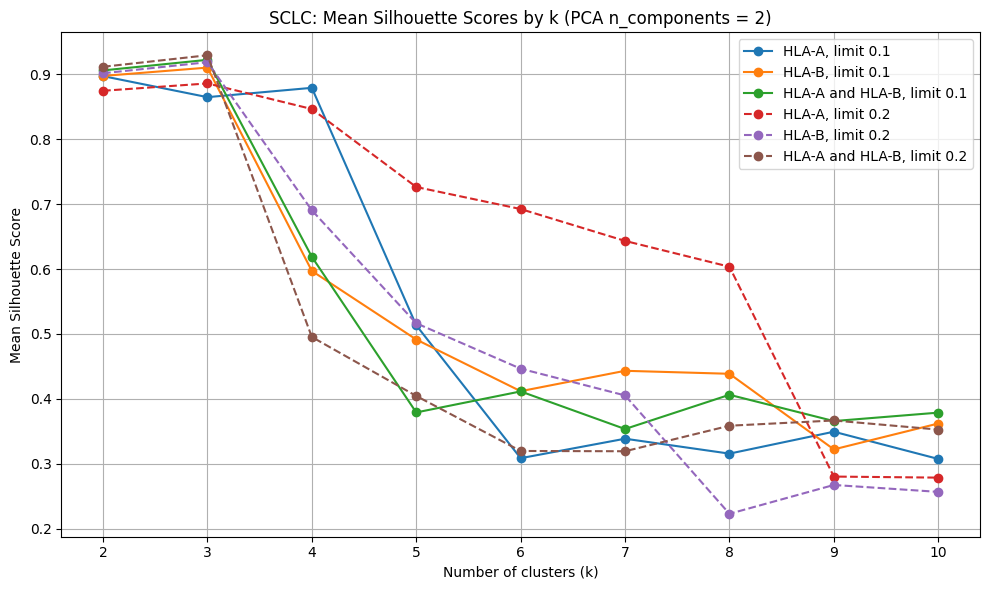

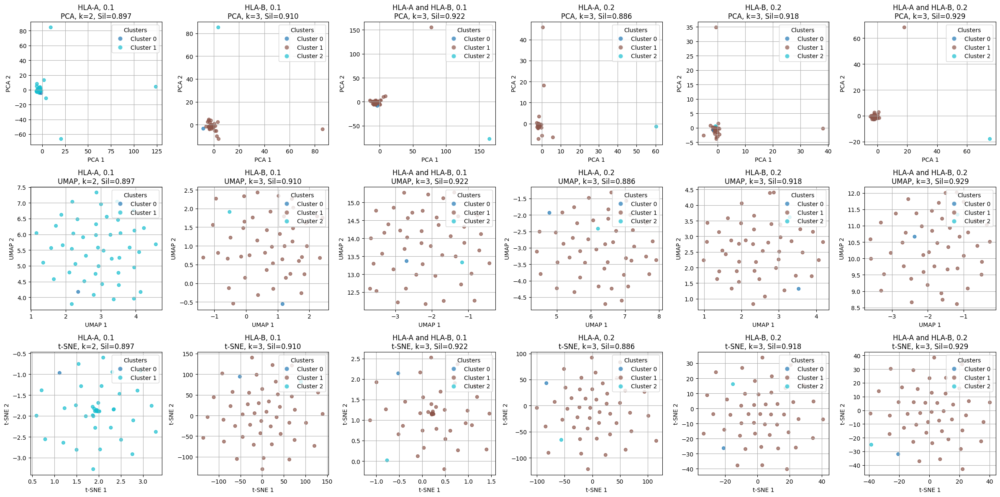

In [ ]:
# testing on non scaled data
# limit = 0.1, PCA n components = 2
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A, 0.1', data_hla_A_1, k=None, n_components=2)
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B, 0.1', data_hla_B_1, k=None, n_components=2)
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B, 0.1', data_hla_AB_1, k=None, n_components=2)
kmeans_sil_list_1 = [kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1]

# limit = 0.2 PCA n components = 2
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A, 0.2', data_hla_A_2, k=None, n_components=2)
kmeans_labels_B2, kmeans_sil_B2, ks = kmeans('HLA-B, 0.2', data_hla_B_2, k=None, n_components=2)
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B, 0.2', data_hla_AB_2, k=None, n_components=2)
kmeans_sil_list_2 = [kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2]

plot_kmeans_scores_projections(data_dict={
    'HLA-A_0.1': data_hla_A_1,
    'HLA-B_0.1': data_hla_B_1,
    'HLA-AB_0.1': data_hla_AB_1,
    'HLA-A_0.2': data_hla_A_2,
    'HLA-B_0.2': data_hla_B_2,
    'HLA-AB_0.2': data_hla_AB_2,
}, n_components=2, kmeans_sil_list_1=kmeans_sil_list_1, kmeans_sil_list_2=kmeans_sil_list_2, ks=ks)

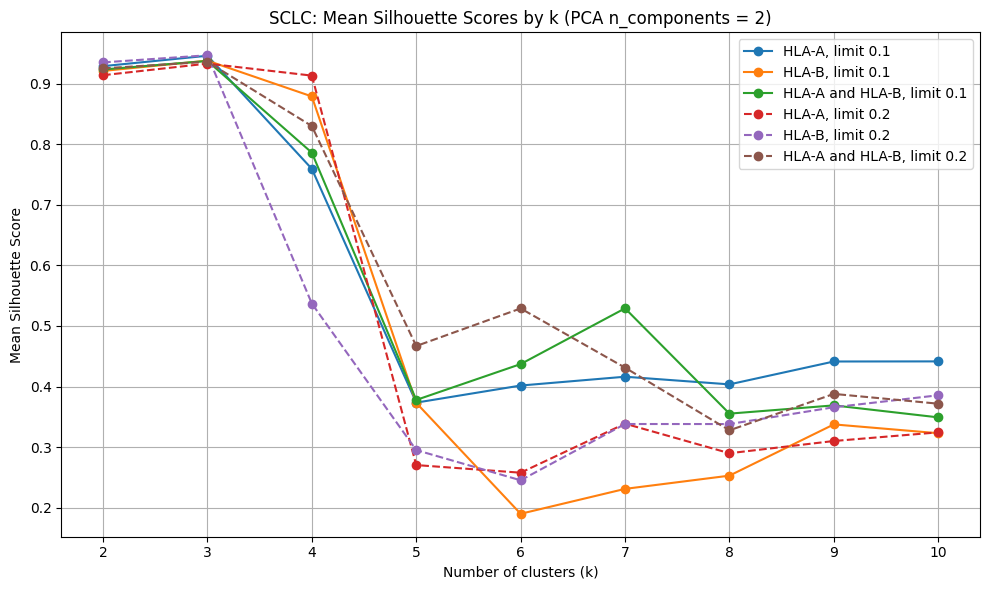

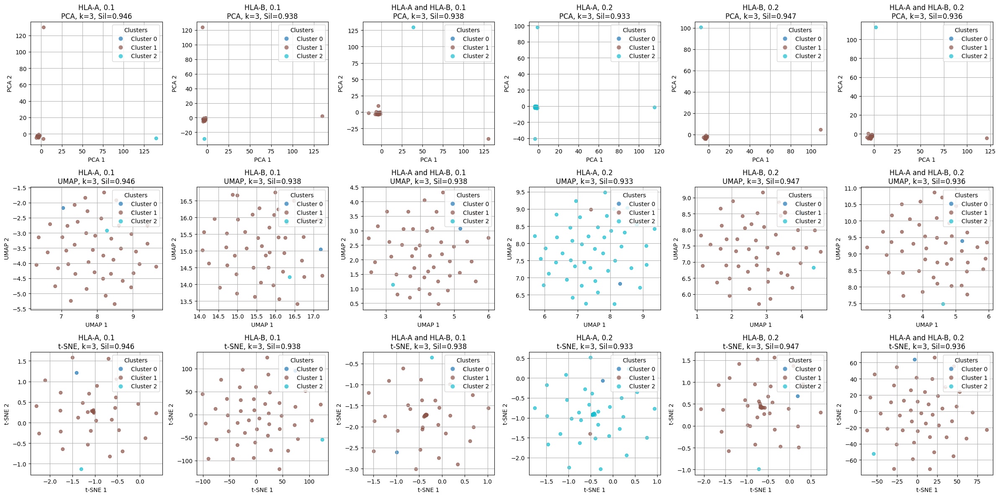

In [ ]:
# limit = 0.1, PCA n components = 2
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A, 0.1', data_hla_A_1_scaled, k=None, n_components=2)
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B, 0.1', data_hla_B_1_scaled, k=None, n_components=2)
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B, 0.1', data_hla_AB_1_scaled, k=None, n_components=2)
kmeans_sil_list_1 = [kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1]

# limit = 0.2, PCA n components = 2
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A, 0.2', data_hla_A_2_scaled, k=None, n_components=2)
kmeans_labels_B2, kmeans_sil_B2, ks = kmeans('HLA-B, 0.2', data_hla_B_2_scaled, k=None, n_components=2)
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B, 0.2', data_hla_AB_2_scaled, k=None, n_components=2)
kmeans_sil_list_2 = [kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2]


plot_kmeans_scores_projections(data_dict={
        'HLA-A_0.1': data_hla_A_1_scaled,
        'HLA-B_0.1': data_hla_B_1_scaled,
        'HLA-AB_0.1': data_hla_AB_1_scaled,
        'HLA-A_0.2': data_hla_A_2_scaled,
        'HLA-B_0.2': data_hla_B_2_scaled,
        'HLA-AB_0.2': data_hla_AB_2_scaled,
    }, n_components=2,
    kmeans_sil_list_1=(kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1),
    kmeans_sil_list_2=(kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2),
    ks=ks
)

In [ ]:
subtype_df.head()
subtype_df = subtype_df.set_index('Sanitized_Sample_ID')
subtype_df.head()

,Subtype
Sanitized_Sample_ID,
CORL279,n
CORL47,a
CORL88,a
CORL95,a
CPCN,NaN


In [ ]:
# kmeans_labels_A1

In [ ]:
samples_A1 = data_hla_A_1.index

cluster_labels_A1 = kmeans_labels_A1[0]
silhouette_scores_A1 = kmeans_sil_A1[0]

subtype_labels = subtype_df.loc[samples_A1, 'Subtype']
# subtype_labels

In [ ]:
clusters_A1 = pd.DataFrame({
    'sample_id': samples_A1,
    'cluster': cluster_labels_A1,
    'silhouette_score': silhouette_scores_A1,
    'subtype': subtype_labels
}).dropna(subset=['subtype'])

# clusters_A1

subtype   a  n  p  y
cluster             
0        21  8  3  3
Adjusted Rand Index: 0.000


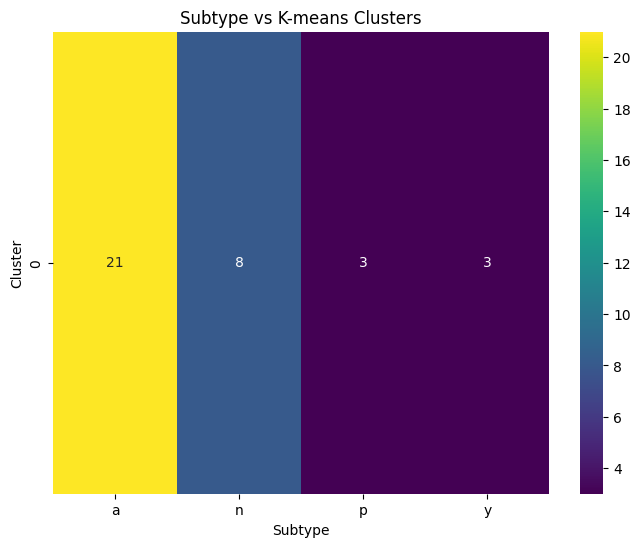

In [ ]:
# Crosstab
ct = pd.crosstab(clusters_A1['cluster'], clusters_A1['subtype'])
print(ct)

# ARI
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(clusters_A1['subtype'], clusters_A1['cluster'])
print(f'Adjusted Rand Index: {ari:.3f}')

# Visualizations
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(ct, annot=True, fmt='d', cmap='viridis')
plt.xlabel('Subtype')
plt.ylabel('Cluster')
plt.title('Subtype vs K-means Clusters')
plt.show()

In [ ]:
def check_clustering(kmeans_labels, kmeans_sil, subtype_df, data, data_name, ks):

  sample_ids = data.index
  subtype_labels = subtype_df.loc[sample_ids, 'Subtype']
  ari_scores = []

  for k_idx, (cluster_labels, silhouette_scores) in enumerate(zip(kmeans_labels, kmeans_sil)):
      k = k_idx + 2  # index 0 -> k=2

      # Create DataFrame
      df_clusters = pd.DataFrame({
          'sample_id': sample_ids,
          'cluster': cluster_labels,
          'silhouette': silhouette_scores,
          'subtype': subtype_labels
      }).dropna(subset=['subtype'])

      # Crosstab
      ct = pd.crosstab(df_clusters['cluster'], df_clusters['subtype'])
      print(f"\n=== {data_name} | k={k} ===")
      print(ct)

      # ARI
      ari = adjusted_rand_score(df_clusters['subtype'], df_clusters['cluster'])
      print(f'Adjusted Rand Index (k={k}): {ari:.3f}')
      ari_scores.append(ari)

      # Heatmap of crosstab
      plt.figure(figsize=(8, 6))
      sns.heatmap(ct, annot=True, fmt='d', cmap='viridis')
      plt.title(f'{data_name} | k={k} - Subtype vs Clusters')
      plt.xlabel('Subtype')
      plt.ylabel('Cluster')
      plt.show()

      # Mean silhouette by cluster-subtype
      mean_silhouette = df_clusters.groupby(['cluster', 'subtype'])['silhouette'].mean().unstack()
      plt.figure(figsize=(8, 6))
      sns.heatmap(mean_silhouette, annot=True, cmap='coolwarm')
      plt.title(f'{dataset_name} | k={k} - Mean Silhouette by Subtype')
      plt.xlabel('Subtype')
      plt.ylabel('Cluster')
      plt.show()

  # Plot ARI scores across k
  plt.figure(figsize=(8, 4))
  plt.plot(range(2, 2 + len(ari_scores)), ari_scores, marker='o', linestyle='-')
  plt.xlabel('Number of Clusters (k)')
  plt.ylabel('Adjusted Rand Index (ARI)')
  plt.title(f'ARI across k for {dataset_name}')
  plt.grid(True)
  plt.show()

  return ari_scores

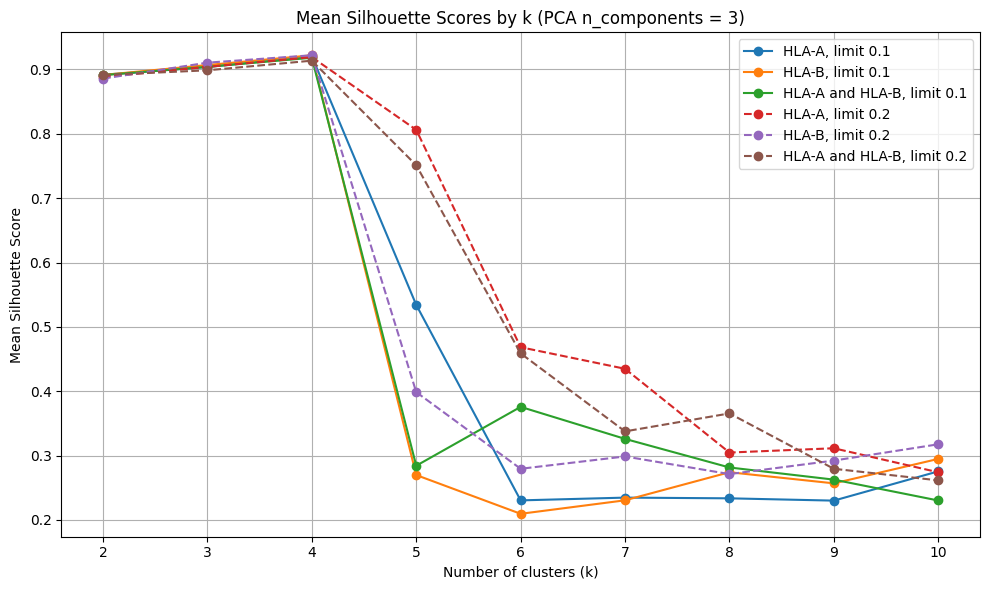

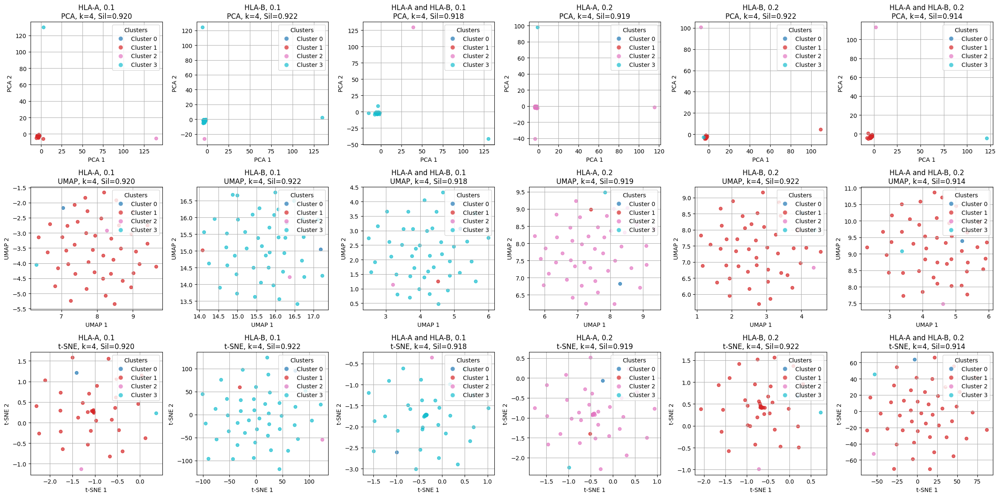

In [ ]:
# limit = 0.1, PCA n components = 3
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A, 0.1', data_hla_A_1_scaled, k=None, n_components=3)
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B, 0.1', data_hla_B_1_scaled, k=None, n_components=3)
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B, 0.1', data_hla_AB_1_scaled, k=None, n_components=3)
kmeans_sil_list_1 = [kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1]

# limit = 0.2, PCA n components = 3
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A, 0.2', data_hla_A_2_scaled, k=None, n_components=3)
kmeans_labels_B2, kmeans_sil_B2, ks = kmeans('HLA-B, 0.2', data_hla_B_2_scaled, k=None, n_components=3)
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B, 0.2', data_hla_AB_2_scaled, k=None, n_components=3)
kmeans_sil_list_2 = [kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2]

plot_kmeans_scores_projections(data_dict={
        'HLA-A_0.1': data_hla_A_1_scaled,
        'HLA-B_0.1': data_hla_B_1_scaled,
        'HLA-AB_0.1': data_hla_AB_1_scaled,
        'HLA-A_0.2': data_hla_A_2_scaled,
        'HLA-B_0.2': data_hla_B_2_scaled,
        'HLA-AB_0.2': data_hla_AB_2_scaled,
        }, n_components=3,
    kmeans_sil_list_1=(kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1),
    kmeans_sil_list_2=(kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2),
    ks=ks
)

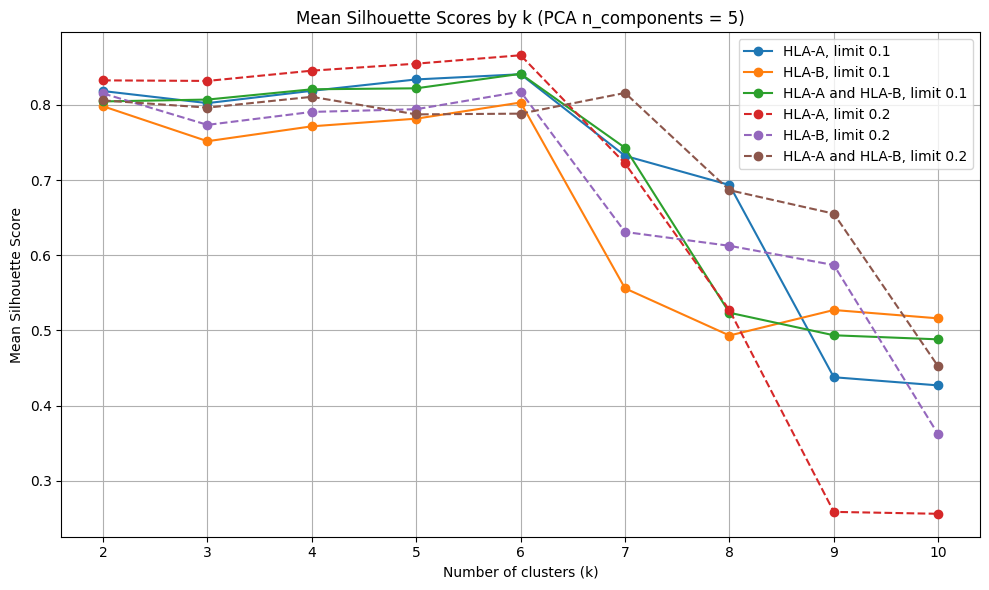

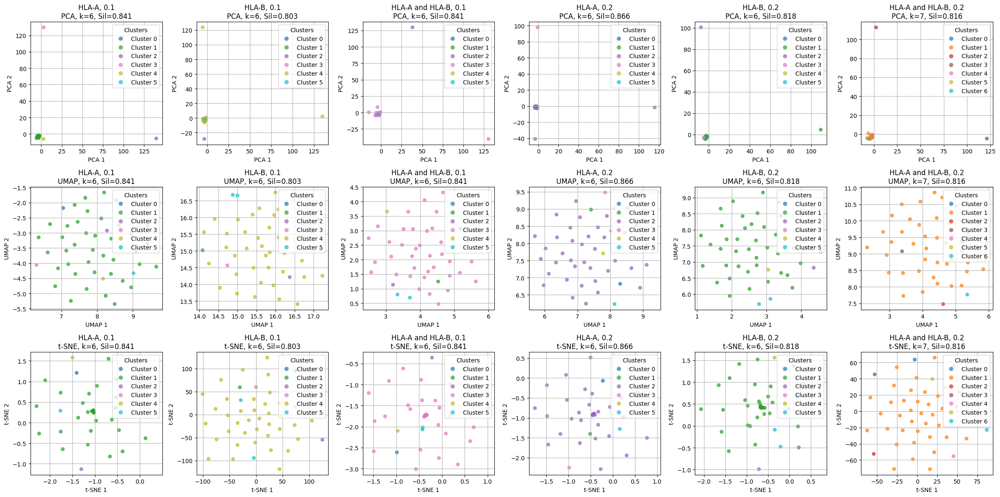

In [ ]:
# limit = 0.1, PCA n components = 5
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A, 0.1', data_hla_A_1_scaled, k=None, n_components=5)
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B, 0.1', data_hla_B_1_scaled, k=None, n_components=5)
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B, 0.1', data_hla_AB_1_scaled, k=None, n_components=5)
kmeans_sil_list_1 = [kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1]

# limit = 0.2, PCA n components = 5
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A, 0.2', data_hla_A_2_scaled, k=None, n_components=5)
kmeans_labels_B2, kmeans_sil_B2, ks = kmeans('HLA-B, 0.2', data_hla_B_2_scaled, k=None, n_components=5)
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B, 0.2', data_hla_AB_2_scaled, k=None, n_components=5)
kmeans_sil_list_2 = [kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2]

data_dict={
        'HLA-A_0.1': data_hla_A_1_scaled,
        'HLA-B_0.1': data_hla_B_1_scaled,
        'HLA-AB_0.1': data_hla_AB_1_scaled,
        'HLA-A_0.2': data_hla_A_2_scaled,
        'HLA-B_0.2': data_hla_B_2_scaled,
        'HLA-AB_0.2': data_hla_AB_2_scaled,
        }

plot_kmeans_scores_projections(data_dict, n_components=5, kmeans_sil_list_1=kmeans_sil_list_1, kmeans_sil_list_2=kmeans_sil_list_2, ks=ks)

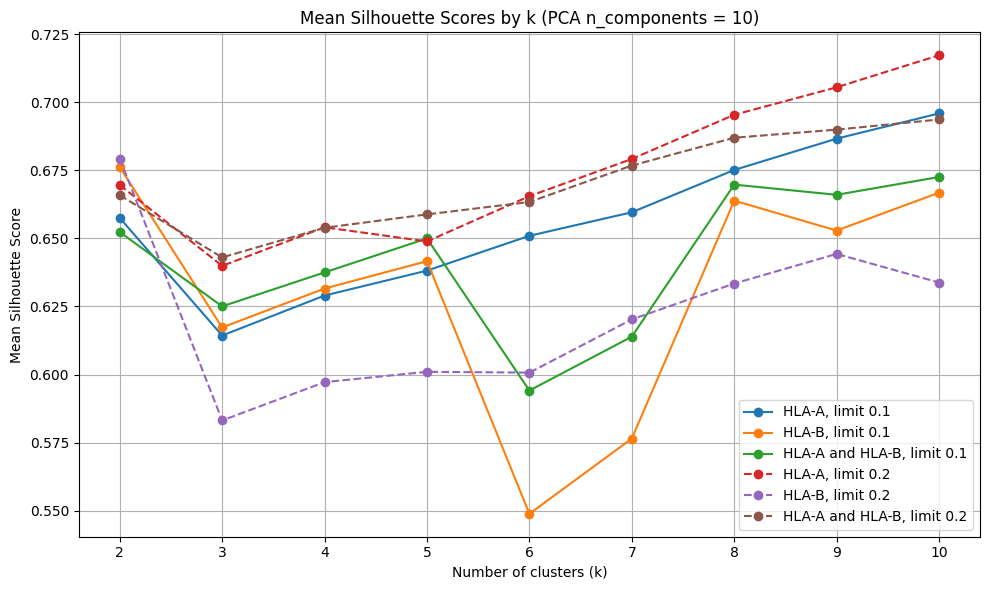

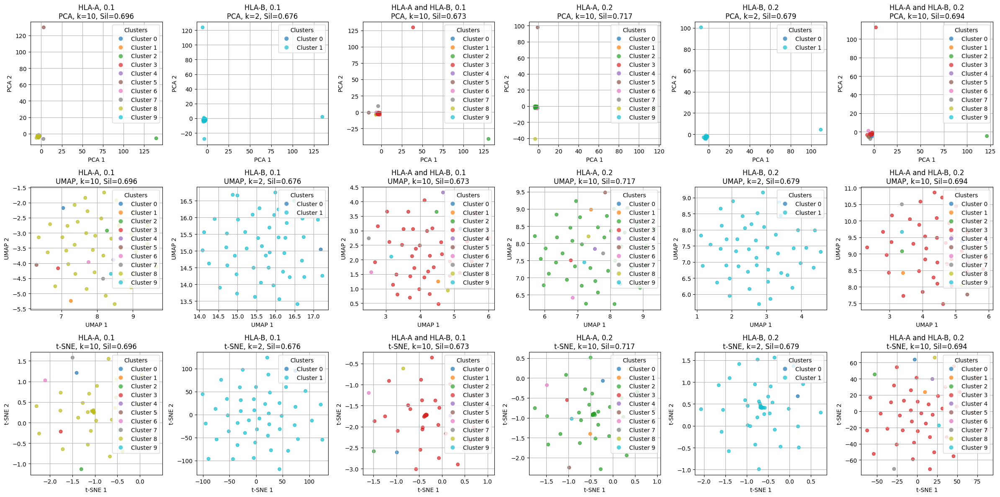

In [ ]:
# limit = 0.1, PCA n components = 10
kmeans_labels_A1, kmeans_sil_A1, ks = kmeans('HLA-A, 0.1', data_hla_A_1_scaled, k=None, n_components=10)
kmeans_labels_B1, kmeans_sil_B1, ks = kmeans('HLA-B, 0.1', data_hla_B_1_scaled, k=None, n_components=10)
kmeans_labels_AB1, kmeans_sil_AB1, ks = kmeans('HLA-A and HLA-B, 0.1', data_hla_AB_1_scaled, k=None, n_components=10)
kmeans_sil_list_1 = [kmeans_sil_A1, kmeans_sil_B1, kmeans_sil_AB1]

# limit = 0.2, PCA n components = 10
kmeans_labels_A2, kmeans_sil_A2, ks = kmeans('HLA-A, 0.2', data_hla_A_2_scaled, k=None, n_components=10)
kmeans_labels_B2, kmeans_sil_B2, ks = kmeans('HLA-B, 0.2', data_hla_B_2_scaled, k=None, n_components=10)
kmeans_labels_AB2, kmeans_sil_AB2, ks = kmeans('HLA-A and HLA-B, 0.2', data_hla_AB_2_scaled, k=None, n_components=10)
kmeans_sil_list_2 = [kmeans_sil_A2, kmeans_sil_B2, kmeans_sil_AB2]

data_dict = {
        'HLA-A_0.1': data_hla_A_1_scaled,
        'HLA-B_0.1': data_hla_B_1_scaled,
        'HLA-AB_0.1': data_hla_AB_1_scaled,
        'HLA-A_0.2': data_hla_A_2_scaled,
        'HLA-B_0.2': data_hla_B_2_scaled,
        'HLA-AB_0.2': data_hla_AB_2_scaled,
    }

plot_kmeans_scores_projections(data_dict, n_components=10, kmeans_sil_list_1=kmeans_sil_list_1, kmeans_sil_list_2=kmeans_sil_list_2, ks=ks)

In [ ]:
def dbscan(name, X_scaled, eps=0.5, min_samples=5, n_components=2):

    # Apply PCA to reduce noise
    pca = PCA(n_components=n_components, random_state=42)
    X_pca = pca.fit_transform(X_scaled)

    db = DBSCAN(eps=eps, min_samples=min_samples)
    labels = db.fit_predict(X_pca)

    # Count number of clusters (excluding noise label -1)
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = np.sum(labels == -1)

    print(f"{name} - DBSCAN after PCA (eps={eps}, min_samples={min_samples}):")
    print(f"\tNumber of clusters (excluding noise): {n_clusters}")
    print(f"\tNumber of noise points: {n_noise}")

    # Compute silhouette score (excluding noise points)
    dbscan_valid = labels != -1
    if np.unique(labels[dbscan_valid]).size > 1:
        dbscan_sil = silhouette_score(X_pca[dbscan_valid], labels[dbscan_valid])
    else:
        dbscan_sil = np.nan

    if not np.isnan(dbscan_sil):
        print(f"\tSilhouette Score: {dbscan_sil:.3f}")
    else:
        print("\tSilhouette Score: Not computable (only one cluster present)")

    return labels, dbscan_sil

In [ ]:
def plot_dbscan(data_dict, eps=0.5, min_samples=5, n_components_pca=2):
    groups = [
        ('HLA-A, 0.1', data_dict['HLA-A_0.1']),
        ('HLA-B, 0.1', data_dict['HLA-B_0.1']),
        ('HLA-A and HLA-B, 0.1', data_dict['HLA-AB_0.1']),
        ('HLA-A, 0.2', data_dict['HLA-A_0.2']),
        ('HLA-B, 0.2', data_dict['HLA-B_0.2']),
        ('HLA-A and HLA-B, 0.2', data_dict['HLA-AB_0.2'])
    ]

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))

    for i, (group_name, data) in enumerate(groups):
        dbscan_labels, dbscan_sil = dbscan(group_name, data, eps=eps, min_samples=min_samples, n_components=n_components_pca)

        # UMAP projection
        reducer = UMAP(n_components=2, random_state=42)
        X_umap = reducer.fit_transform(data)

        ax = axes[i // 3, i % 3]
        unique_labels = set(dbscan_labels)
        for label in unique_labels:
            if label == -1:
                color = 'k'
                marker = 'x'
                label_name = 'Noise'
            else:
                color = None
                marker = 'o'
                label_name = f'Cluster {label}'

            sns.scatterplot(
                x=X_umap[dbscan_labels == label, 0],
                y=X_umap[dbscan_labels == label, 1],
                marker=marker,
                label=label_name,
                s=30,
                ax=ax,
                palette='tab10'
            )

        ax.set_title(f"{group_name}\nSilhouette={dbscan_sil:.3f}" if not np.isnan(dbscan_sil)
                      else f"{group_name}\nSilhouette=N/A")
        ax.set_xlabel("UMAP 1")
        ax.set_ylabel("UMAP 2")
        ax.grid(True)

        # Custom legend
        handles = []
        for cluster_id in np.unique(dbscan_labels):
            rgba_color = plt.cm.tab10(cluster_id % 10) if cluster_id != -1 else (0, 0, 0, 1)
            handles.append(
                plt.Line2D([], [], marker='o' if cluster_id != -1 else 'x',
                           color='w', markerfacecolor=rgba_color,
                           markeredgecolor=rgba_color,
                           label='Noise' if cluster_id == -1 else f'Cluster {cluster_id}',
                           markersize=8, alpha=0.7)
            )
        ax.legend(handles=handles, title='Label', loc='upper right')

    plt.tight_layout()
    plt.show()

HLA-A, 0.1 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding noise): 1
	Number of noise points: 19
	Silhouette Score: Not computable (only one cluster present)
HLA-B, 0.1 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding noise): 1
	Number of noise points: 16
	Silhouette Score: Not computable (only one cluster present)
HLA-A and HLA-B, 0.1 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding noise): 1
	Number of noise points: 19
	Silhouette Score: Not computable (only one cluster present)
HLA-A, 0.2 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding noise): 1
	Number of noise points: 10
	Silhouette Score: Not computable (only one cluster present)
HLA-B, 0.2 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding noise): 2
	Number of noise points: 9
	Silhouette Score: 0.563
HLA-A and HLA-B, 0.2 - DBSCAN after PCA (eps=0.5, min_samples=5):
	Number of clusters (excluding 

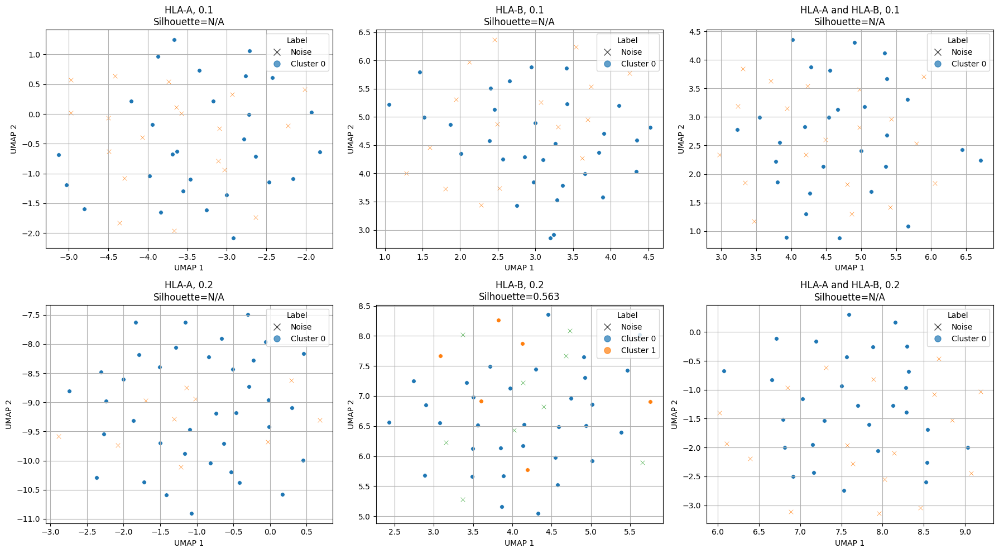

In [ ]:
plot_dbscan(
    data_dict={
        'HLA-A_0.1': data_hla_A_1_scaled,
        'HLA-B_0.1': data_hla_B_1_scaled,
        'HLA-AB_0.1': data_hla_AB_1_scaled,
        'HLA-A_0.2': data_hla_A_2_scaled,
        'HLA-B_0.2': data_hla_B_2_scaled,
        'HLA-AB_0.2': data_hla_AB_2_scaled,
    },
    eps=0.5,
    min_samples=5,
    n_components_pca=2
)

#### Clustering with Filtered Dataset

In [ ]:
# Get the unique, informative genes for a dataset
def get_unique_genes(data, name):
  non_zero_unique_counts = data.apply(lambda col: col[col != 0].nunique())
  informative_genes = non_zero_unique_counts[non_zero_unique_counts > 1]
  informative_genes_df = informative_genes.sort_values(ascending=False).to_frame(name="Unique Non-Zero Values")

  data_filtered = data[informative_genes.index]
  X_filtered_scaled = StandardScaler().fit_transform(data_filtered)

  print(f"{name} - Top Informative Genes:")
  print(informative_genes_df.head)

  # Plots histogram of informative genes
  plt.figure(figsize=(10, 6))
  bins = range(1, int(informative_genes_df["Unique Non-Zero Values"].max()) + 2)
  sns.histplot(informative_genes_df["Unique Non-Zero Values"], bins=bins, kde=False)
  plt.title("Histogram of Unique Non-Zero Values per Gene")
  plt.xlabel("Number of Unique Non-Zero Values")
  plt.ylabel("Number of Genes")
  plt.xticks(bins)
  plt.show()

  return data_filtered, X_filtered_scaled


HLA-A - Top Informative Genes:
<bound method NDFrame.head of          Unique Non-Zero Values
TTN                          37
MUC16                        26
RYR2                         21
CSMD1                        21
CSMD3                        20
...                         ...
GOT1                          2
GORASP2                       2
GOLT1B                        2
GOLT1A                        2
AARD                          2

[17684 rows x 1 columns]>


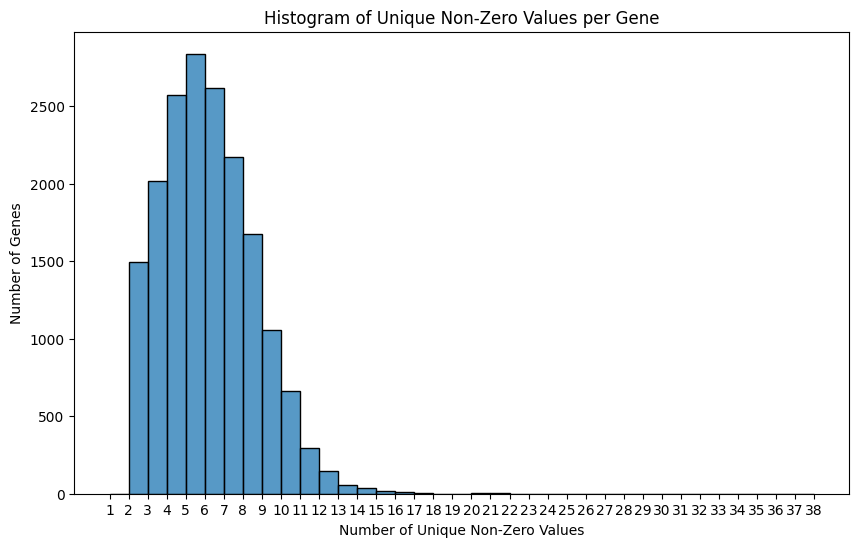

HLA-A - K-Means:
	k = 2, Silhouette Score: -0.07162445801276975
	k = 3, Silhouette Score: 0.5808250275650353
	k = 4, Silhouette Score: 0.5812874386856085
	k = 5, Silhouette Score: 0.5815547752684175
	k = 6, Silhouette Score: 0.4867361287800988
	k = 7, Silhouette Score: 0.29065630993121927
	k = 8, Silhouette Score: -0.14070106398450585
	k = 9, Silhouette Score: -0.14022634431738465
	k = 10, Silhouette Score: -0.1391931466908321
HLA-A - DBSCAN Silhouette Score: Not computable (only one cluster)


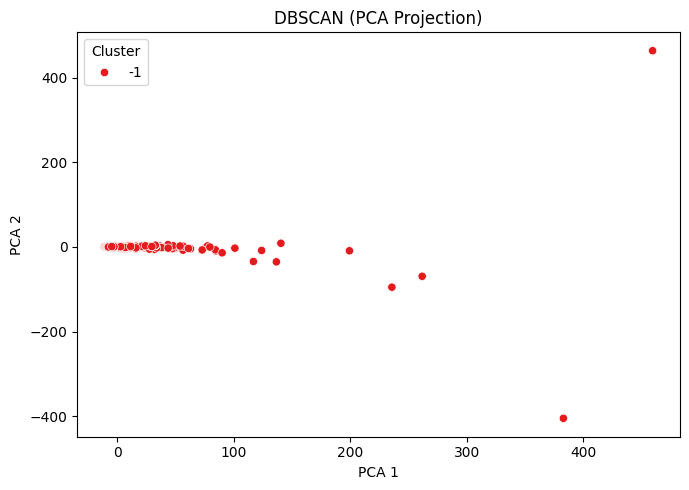

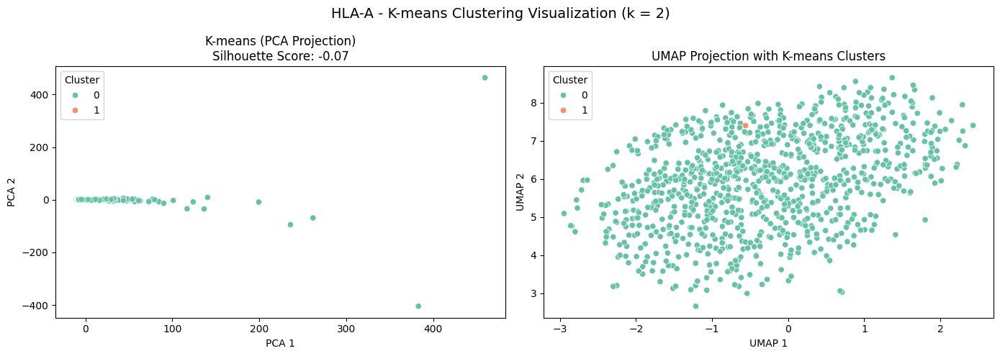

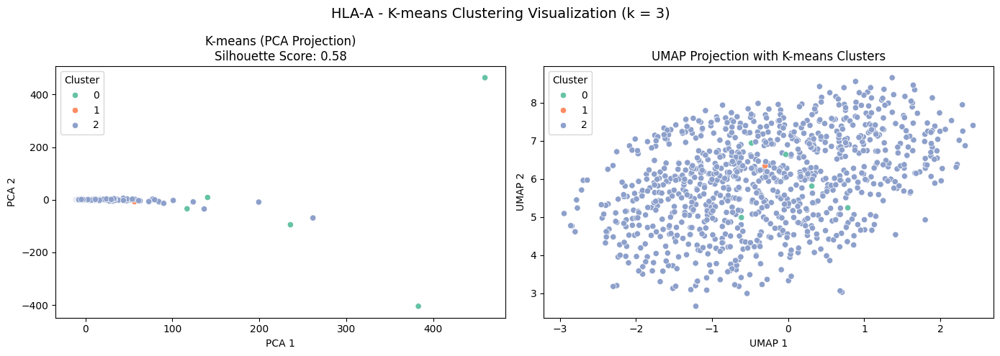

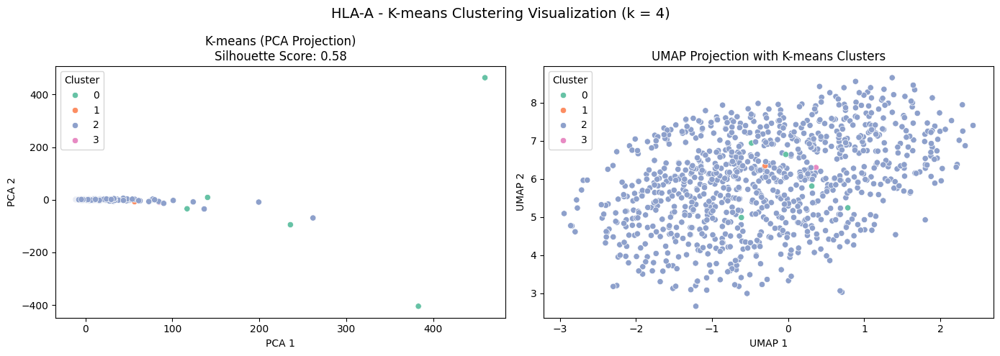

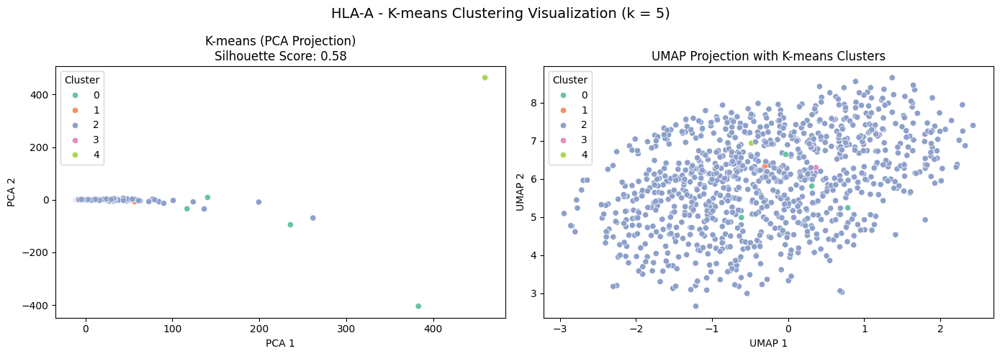

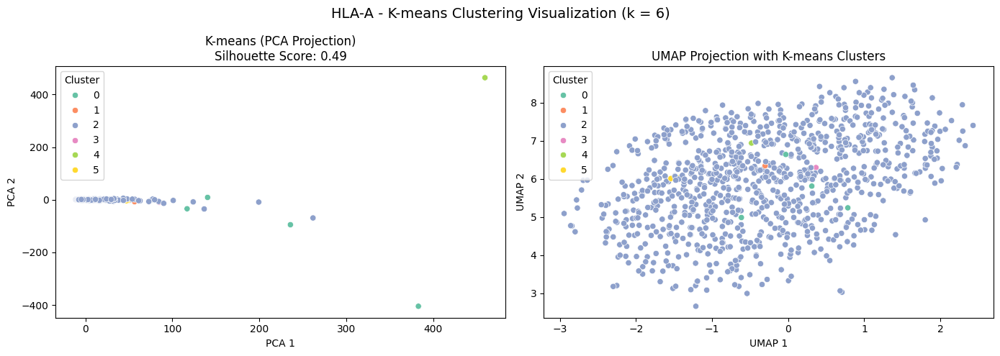

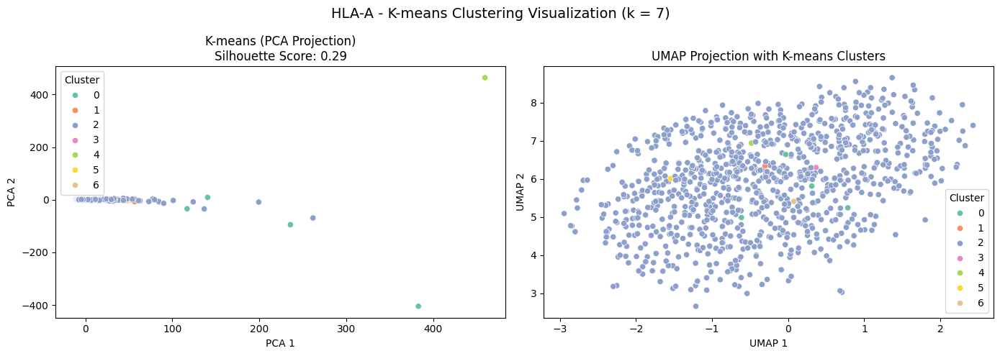

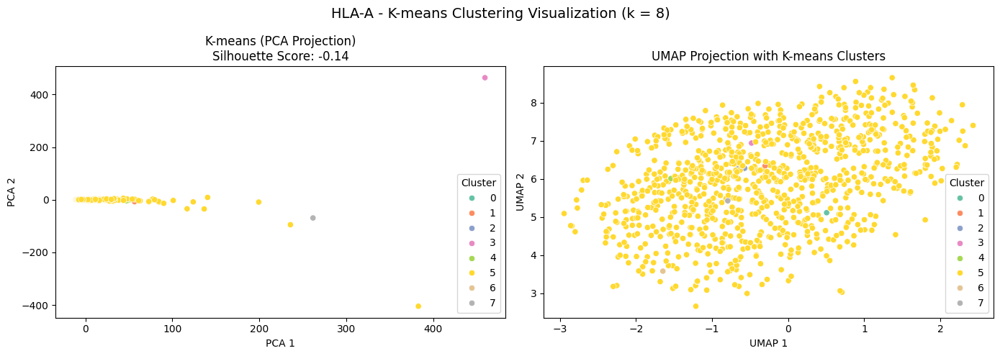

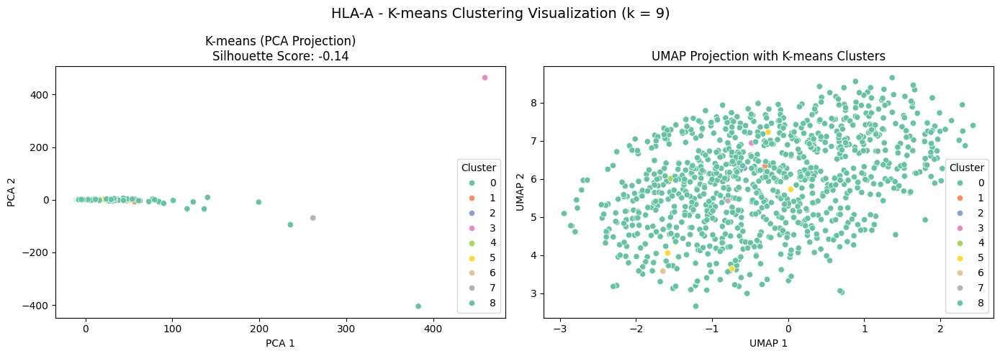

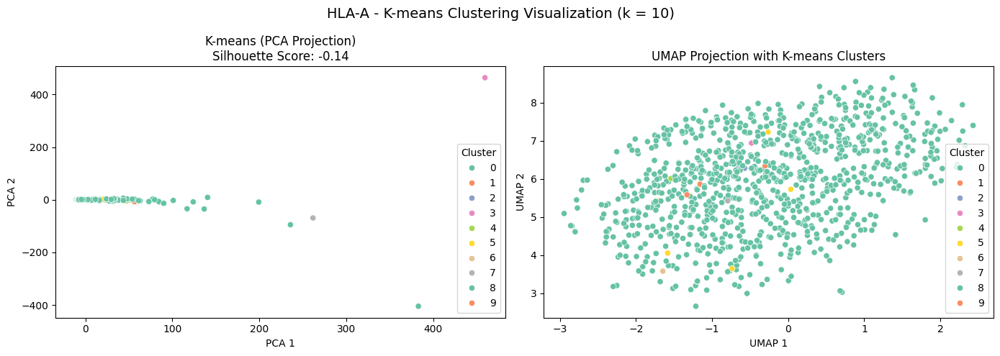

In [ ]:
unique_hla_A_filtered, unique_hla_A_filtered_scaled = get_unique_genes(data_hla_A, 'HLA-A')

# HLA-A binders
kmeans_labels_A, kmeans_sil_A, ks = kmeans('HLA-A', unique_hla_A_filtered_scaled, k=None)
dbscan_labels_A, dbscan_sil_A = dbscan('HLA-A', unique_hla_A_filtered_scaled)
pca_A = PCA(n_components=2)
X_pca_A = pca_A.fit_transform(unique_hla_A_filtered_scaled)
generate_plots('HLA-A', kmeans_labels_A, kmeans_sil_A, ks, dbscan_labels_A, X_pca_A, unique_hla_A_filtered_scaled)

HLA-B - Top Informative Genes:
<bound method NDFrame.head of          Unique Non-Zero Values
TTN                          35
MUC16                        21
PLEC                         16
DNHD1                        15
DNAH10                       15
...                         ...
SEC14L6                       2
SEC62                         2
SEC61B                        2
ZWINT                         2
ZUFSP                         2

[17613 rows x 1 columns]>


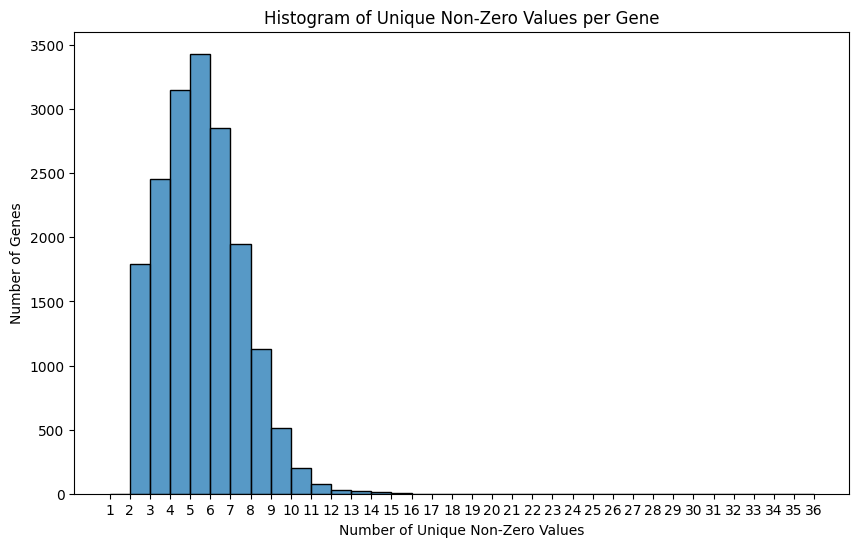

HLA-B - K-Means:
	k = 2, Silhouette Score: 0.6032474001408115
	k = 3, Silhouette Score: 0.4010785451003467
	k = 4, Silhouette Score: 0.40284199971076323
	k = 5, Silhouette Score: 0.39384234928745365
	k = 6, Silhouette Score: 0.3960958993268549
	k = 7, Silhouette Score: 0.39744227338646676
	k = 8, Silhouette Score: 0.4019644876931401
	k = 9, Silhouette Score: 0.40278477765609466
	k = 10, Silhouette Score: 0.40299777439788426
HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


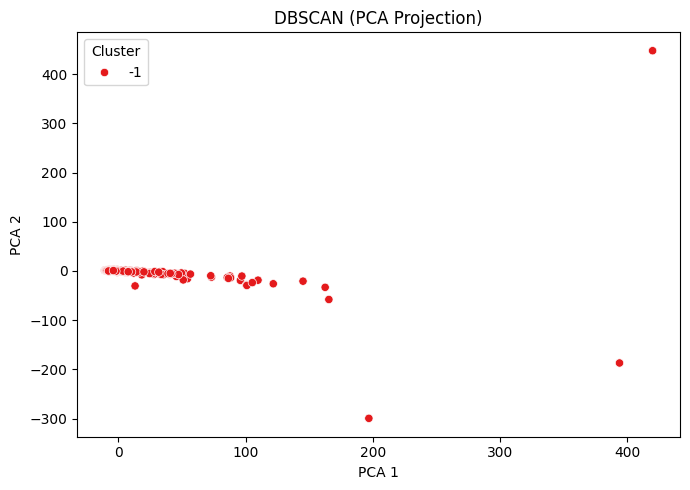

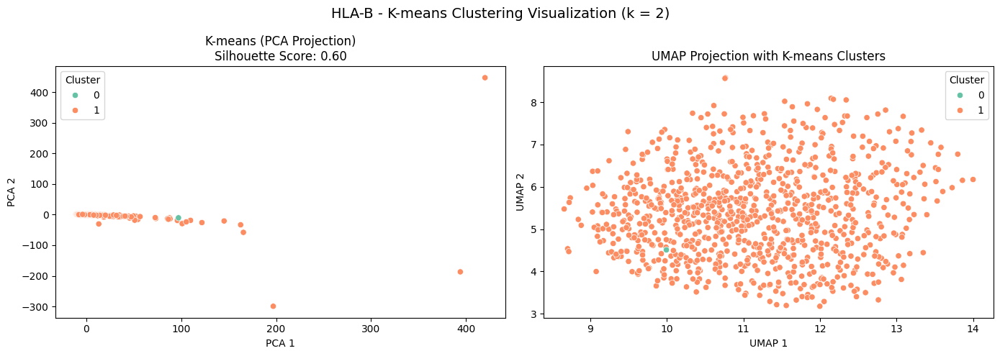

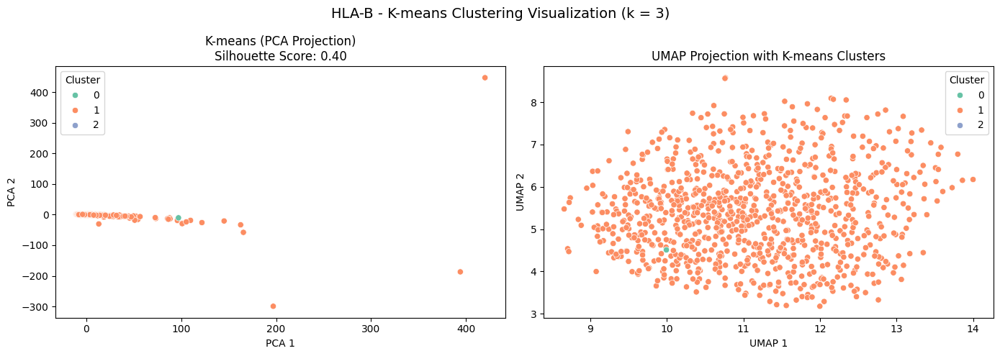

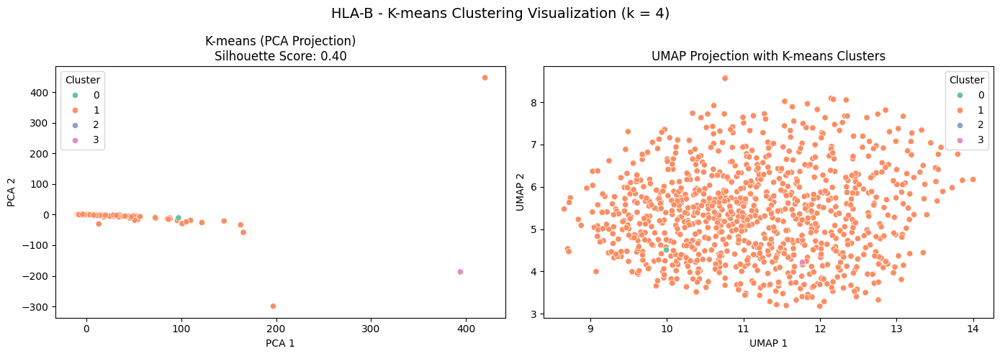

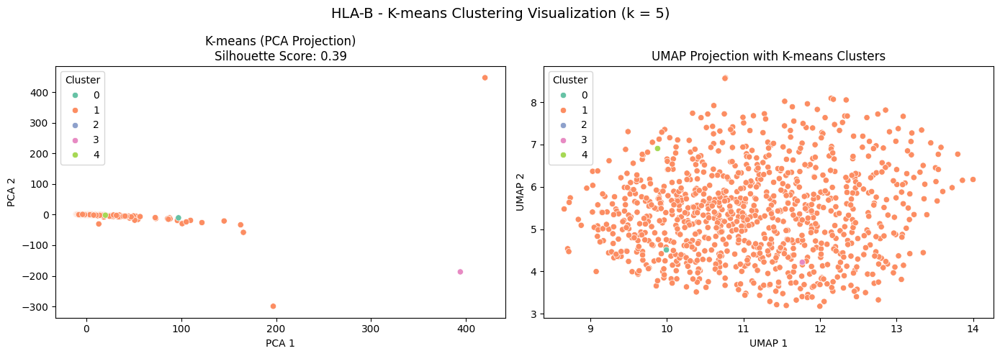

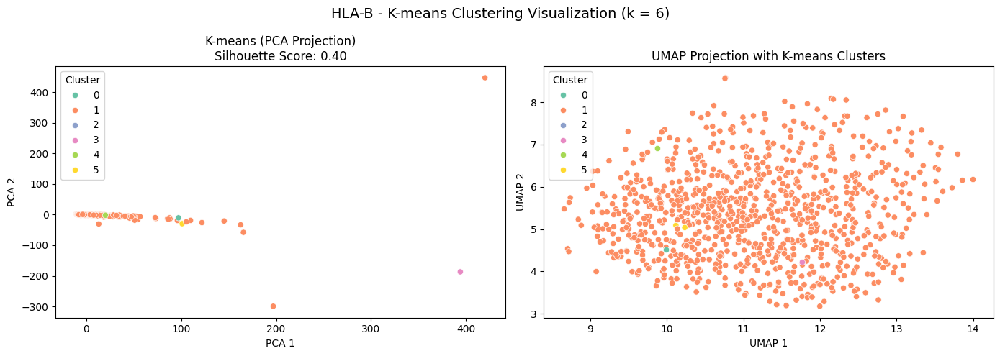

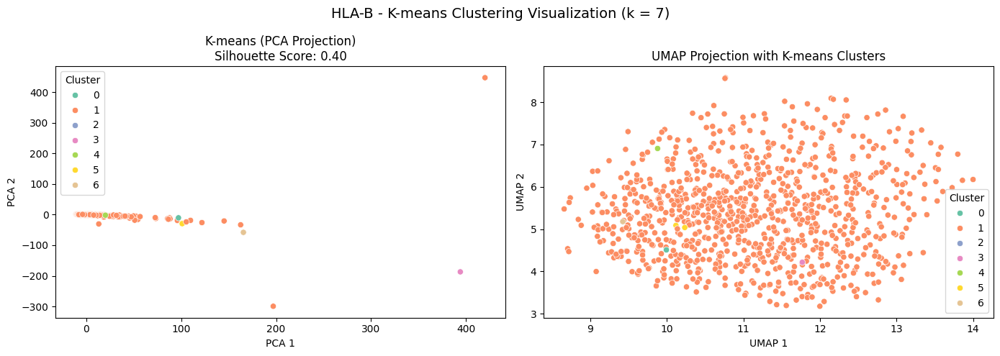

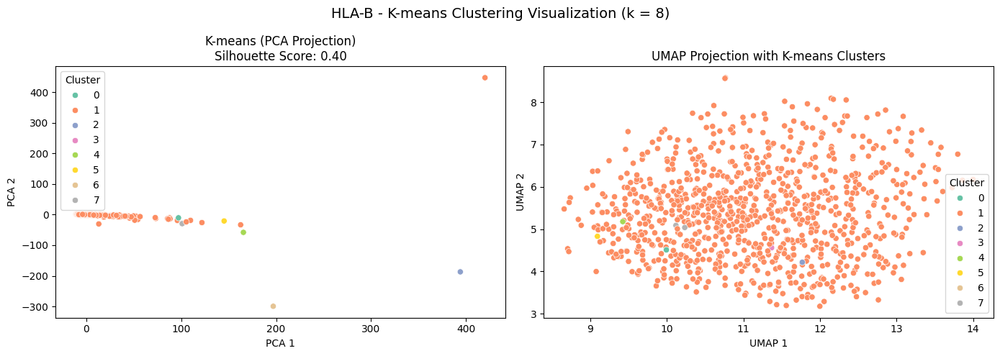

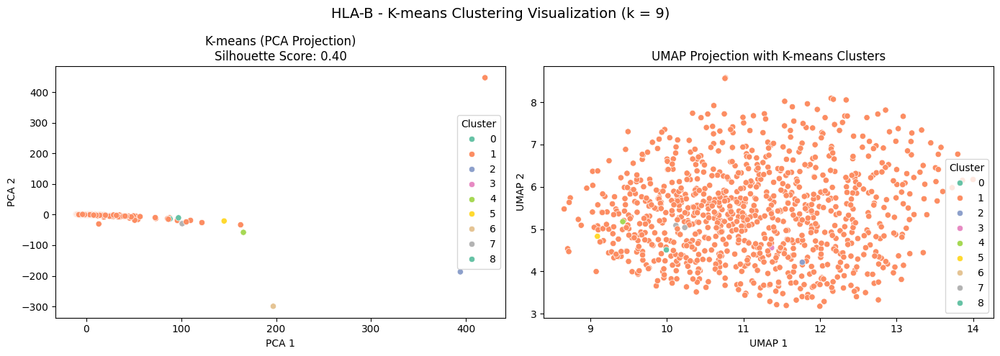

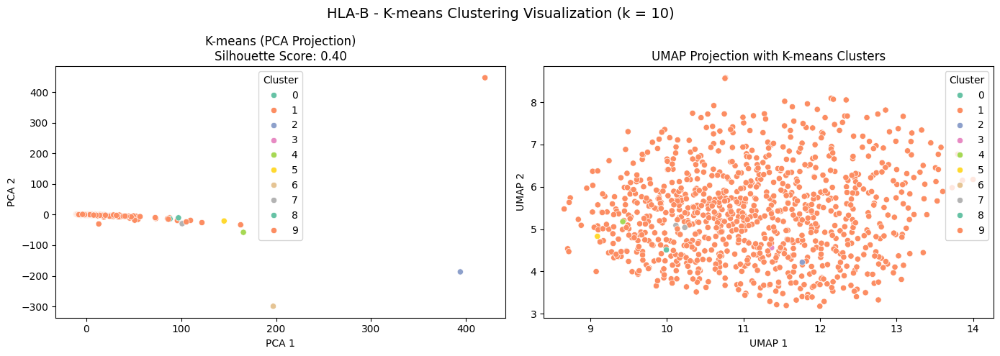

In [ ]:
unique_hla_B_filtered, unique_hla_B_filtered_scaled = get_unique_genes(data_hla_B, 'HLA-B')

# HLA-B binders
kmeans_labels_B, kmeans_sil_B, ks = kmeans('HLA-B', unique_hla_B_filtered_scaled, k=None)
dbscan_labels_B, dbscan_sil_B = dbscan('HLA-B', unique_hla_B_filtered_scaled)
pca_B = PCA(n_components=2)
X_pca_B = pca_B.fit_transform(unique_hla_B_filtered_scaled)
generate_plots('HLA-B', kmeans_labels_B, kmeans_sil_B, ks, dbscan_labels_B, X_pca_B, unique_hla_B_filtered_scaled)

In [ ]:
# unique_hla_AB_filtered, unique_hla_AB_filtered_scaled = get_unique_genes(data_hla_AB, 'HLA-AB')

# # Both HLA-A and HLA-B binders
# kmeans_labels_AB, kmeans_sil_AB = kmeans('HLA-A and HLA-B', unique_hla_AB_filtered_scaled, k=4)
# dbscan_labels_AB, dbscan_sil_AB = dbscan('HLA-A and HLA-B', unique_hla_AB_filtered_scaled)
# pca_AB = PCA(n_components=2)
# X_pca_AB = pca_AB.fit_transform(unique_hla_AB_filtered_scaled)
# generate_plots('HLA-A and HLA-B', kmeans_labels_AB, dbscan_labels_AB, X_pca_AB, unique_hla_AB_filtered_scaled)

##### Clustering on Further Filtered Genes

In [ ]:
# Establish a high signal mask to further filter important genes
def signal_threshold(data, name):
  threshold = 300
  data_filtered, data_filtered_scaled = get_unique_genes(data, name)
  non_zero_counts_per_sample = data_filtered.astype(bool).sum(axis=1).sort_values()

  high_signal_mask = non_zero_counts_per_sample >= threshold
  data_filtered_threshold = data_filtered[high_signal_mask]
  X_filtered_threshold_scaled = StandardScaler().fit_transform(data_filtered_threshold)
  print(f'{name} - data size: {X_filtered_threshold_scaled.shape}')
  print(f'{name} - data size: {data_filtered_threshold.shape}')


  kmeans_filtered_threshold_labels, kmeans_sil, ks = kmeans(name, X_filtered_threshold_scaled, k=None)
  dbscan_filtered_threshold_labels, dbscan_sil = dbscan(name, X_filtered_threshold_scaled)
  pca = PCA(n_components=2)
  X_filtered_threshold_pca = pca.fit_transform(X_filtered_threshold_scaled)
  generate_plots(name, kmeans_filtered_threshold_labels, kmeans_sil, ks, dbscan_filtered_threshold_labels, X_filtered_threshold_pca, X_filtered_threshold_scaled)


  # plt.figure(figsize=(14, 10))

  # # 1. K-means clustering
  # plt.subplot(2, 2, 1)
  # sns.scatterplot(x=X_filtered_threshold_pca[:, 0], y=X_filtered_threshold_pca[:, 1], hue=kmeans_filtered_threshold_labels, palette='Set2')
  # plt.title("K-means (PCA Projection; Further Filtered Genes)")
  # plt.xlabel("PCA 1")
  # plt.ylabel("PCA 2")

  # # 2. DBSCAN clustering
  # plt.subplot(2, 2, 2)
  # sns.scatterplot(x=X_filtered_threshold_pca[:, 0], y=X_filtered_threshold_pca[:, 1], hue=dbscan_filtered_threshold_labels, palette='Set1')
  # plt.title("DBSCAN (PCA Projection; Further Filtered Genes)")
  # plt.xlabel("PCA 1")
  # plt.ylabel("PCA 2")

  # # 3. UMAP (using K-means labels)
  # plt.subplot(2, 2, 3)
  # umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
  # X_umap_filtered_threshold = umap_model.fit_transform(X_filtered_threshold_scaled)
  # sns.scatterplot(x=X_umap_filtered_threshold[:, 0], y=X_umap_filtered_threshold[:, 1], hue=kmeans_filtered_threshold_labels, palette='Set2')
  # plt.title("UMAP Projection with K-means Clusters; Further Filtered Genes")
  # plt.xlabel("UMAP 1")
  # plt.ylabel("UMAP 2")
  # plt.legend(title="Cluster")
  # plt.tight_layout()
  # plt.show()

  # plt.tight_layout()
  # plt.show()


HLA-A - Top Informative Genes:
<bound method NDFrame.head of          Unique Non-Zero Values
TTN                          37
MUC16                        26
RYR2                         21
CSMD1                        21
CSMD3                        20
...                         ...
GOT1                          2
GORASP2                       2
GOLT1B                        2
GOLT1A                        2
AARD                          2

[17684 rows x 1 columns]>


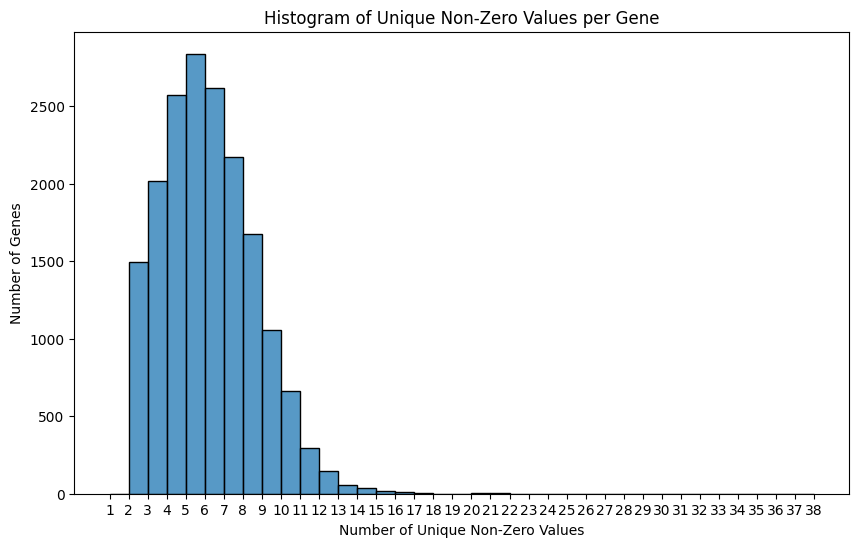

HLA-A - data size: (159, 17684)
HLA-A - data size: (159, 17684)
HLA-A - K-Means:
	k = 2, Silhouette Score: 0.19739595415345626
	k = 3, Silhouette Score: -0.10721658000980373
	k = 4, Silhouette Score: -0.10012528321596931
	k = 5, Silhouette Score: -0.09802312415316886
	k = 6, Silhouette Score: -0.09181679791525521
	k = 7, Silhouette Score: -0.08669764693933493
	k = 8, Silhouette Score: -0.13853145547043436
	k = 9, Silhouette Score: -0.137132555980986
	k = 10, Silhouette Score: -0.13517784472954603
HLA-A - DBSCAN Silhouette Score: Not computable (only one cluster)


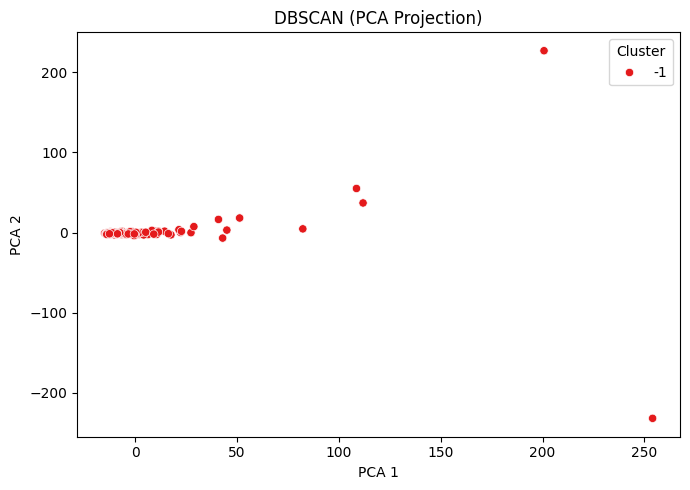

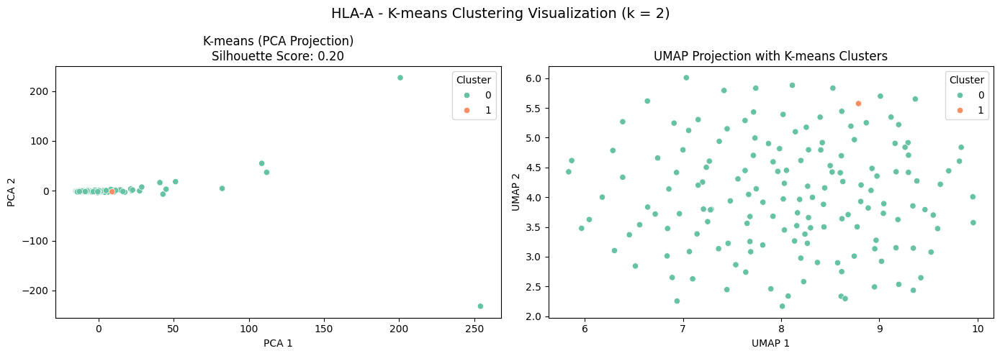

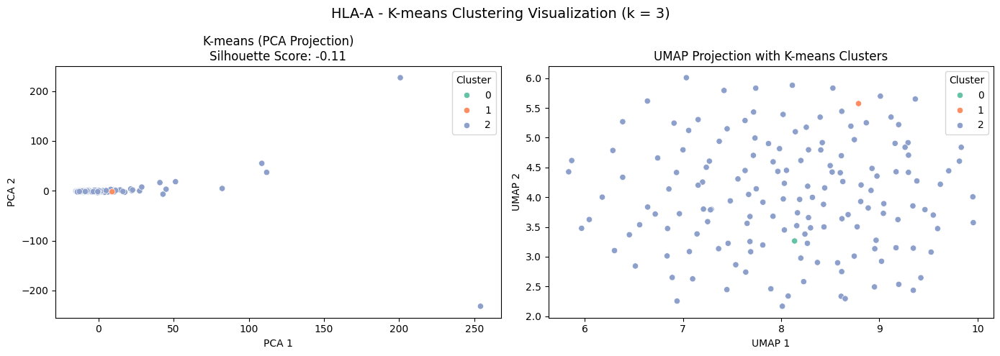

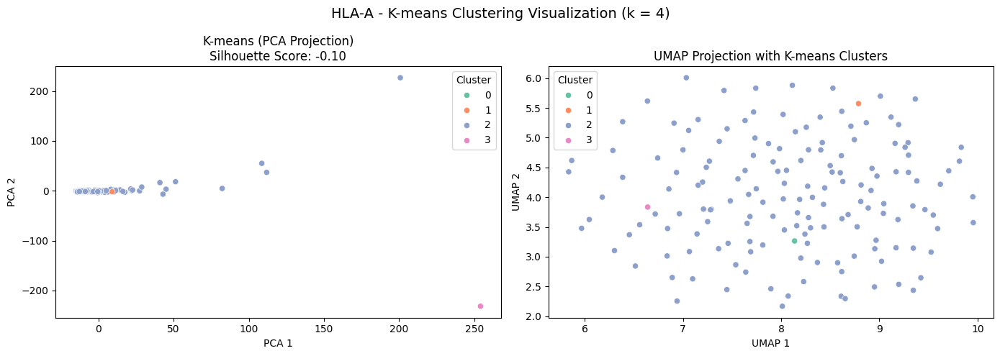

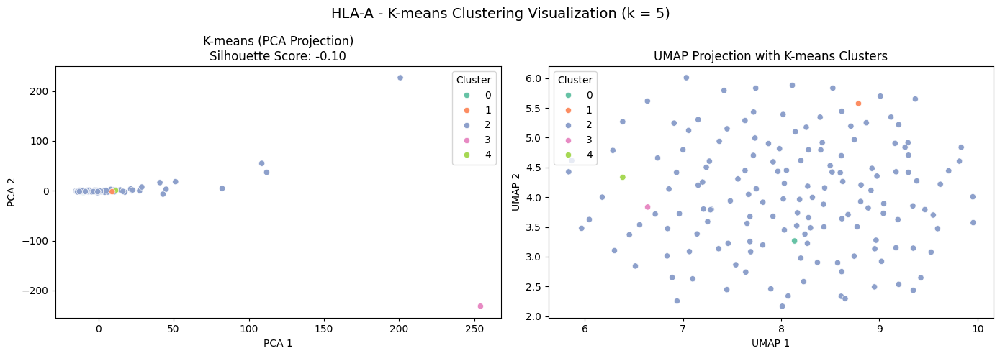

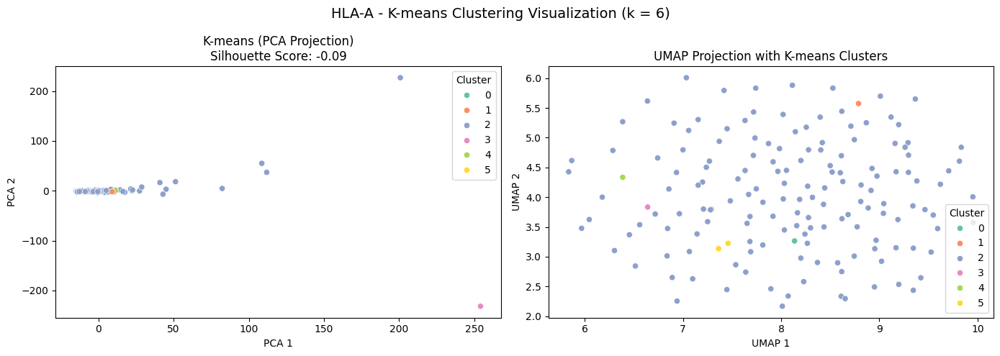

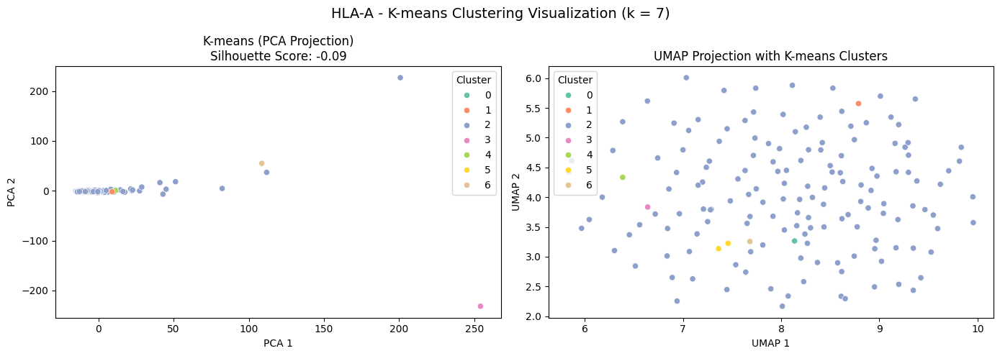

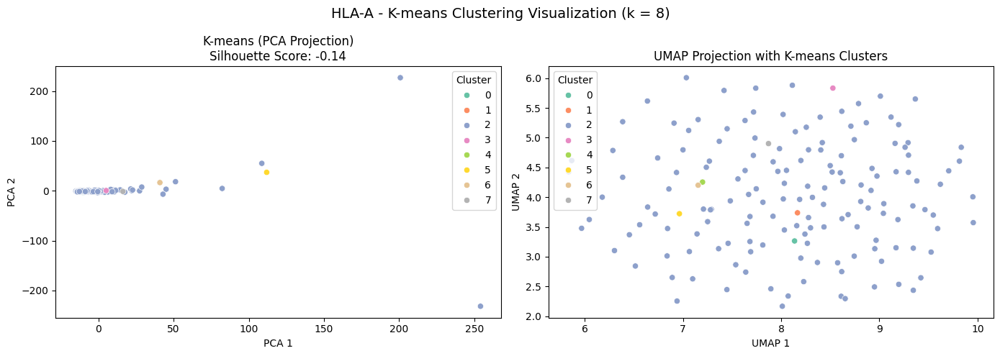

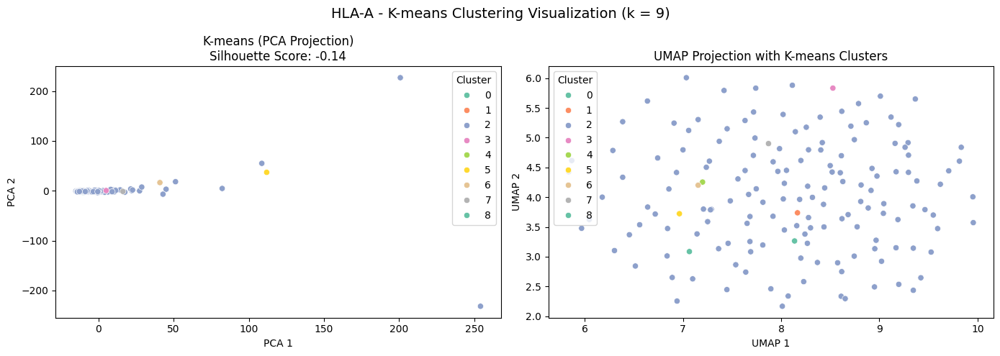

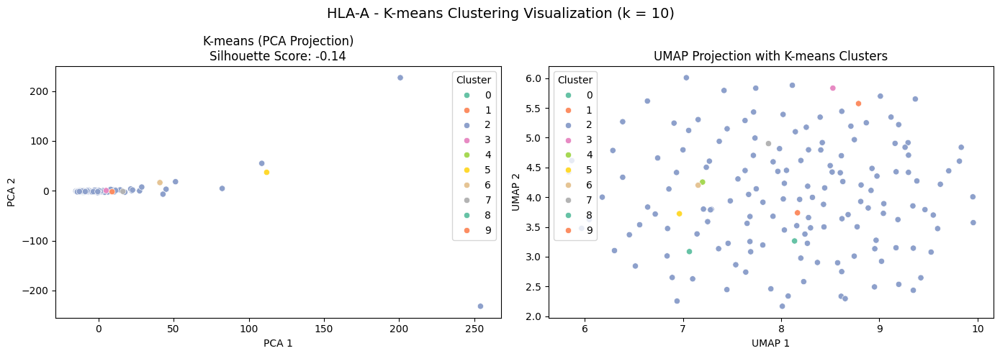

In [ ]:
# HLA-A binders
signal_threshold(data_hla_A, 'HLA-A')

HLA-B - Top Informative Genes:
<bound method NDFrame.head of          Unique Non-Zero Values
TTN                          35
MUC16                        21
PLEC                         16
DNHD1                        15
DNAH10                       15
...                         ...
SEC14L6                       2
SEC62                         2
SEC61B                        2
ZWINT                         2
ZUFSP                         2

[17613 rows x 1 columns]>


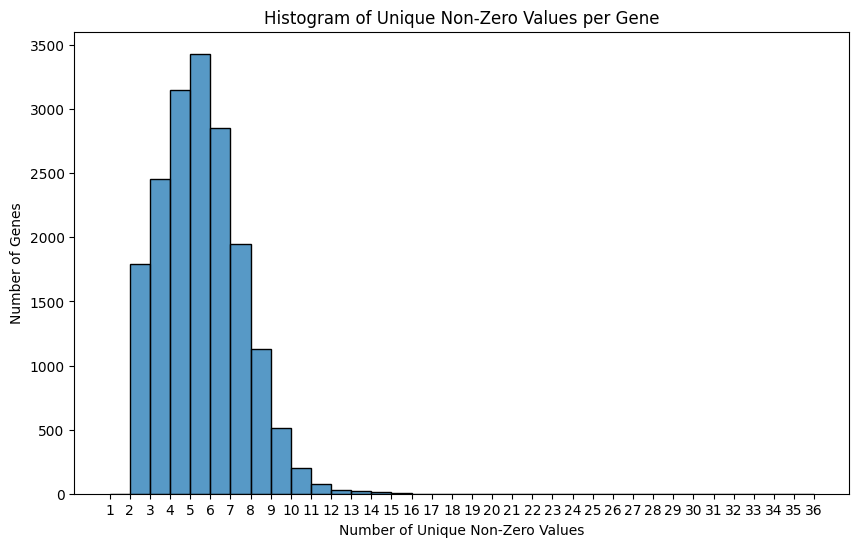

HLA-B - data size: (166, 17613)
HLA-B - data size: (166, 17613)
HLA-B - K Means: k = 4, Silhouette Score: 0.06343435014300802
HLA-B - DBSCAN Silhouette Score: Not computable (only one cluster)


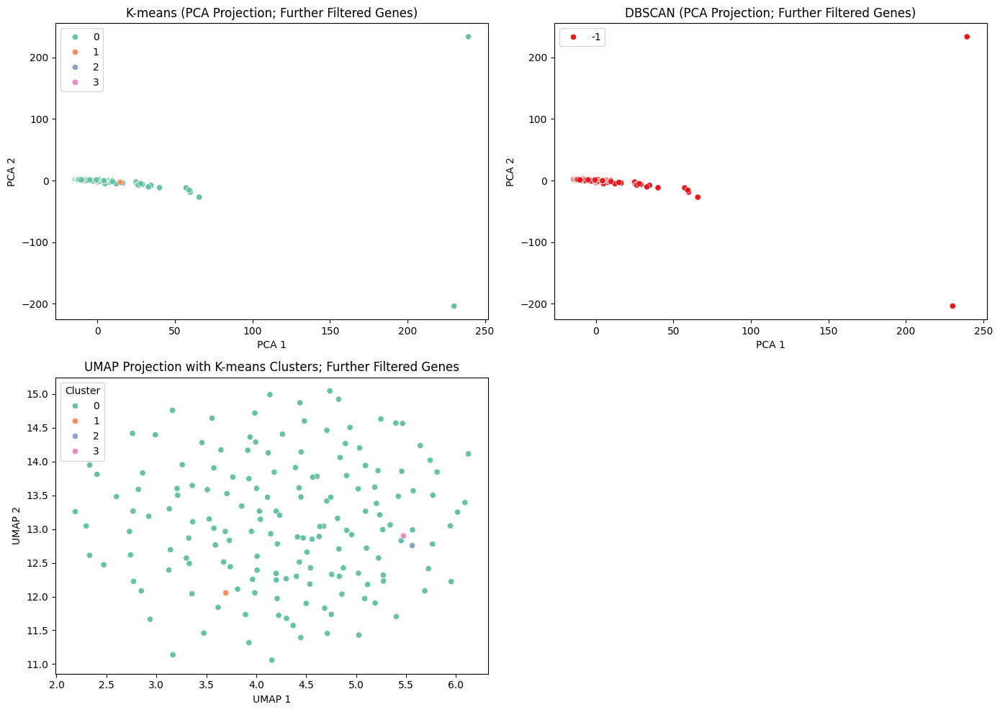

<Figure size 640x480 with 0 Axes>

In [ ]:
# HLA-B binders
signal_threshold(data_hla_B, 'HLA-B')

In [ ]:
# HLA-A and HLA-B binders
# signal_threshold(data_hla_AB, 'HLA-A and HLA-B')

#### Clustering: Hierarchical

In [ ]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [ ]:
def hierarchical(name, X_scaled, n_clusters):
    # Compute linkage matrix for dendrogram
    Z = linkage(X_scaled, method='ward')

    # Create subplots for dendrogram and UMAP side by side
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

    # Dendrogram
    dendrogram(Z, no_labels=True, ax=axs[0])
    axs[0].set_title(f"{name} - Dendrogram")
    axs[0].set_xlabel('Samples')
    axs[0].set_ylabel('Distance')

    # Hierarchical clustering
    hier = AgglomerativeClustering(n_clusters=4)
    labels = hier.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)
    print(f"Hierarchical Clustering Silhouette Score: {sil}")

    # UMAP plot
    reducer = umap.UMAP(random_state=42)
    embedding = reducer.fit_transform(X_scaled)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=labels, palette='tab10', ax=axs[1])
    axs[1].set_title(f"{name} - UMAP (Hierarchical)")
    axs[1].set_xlabel('UMAP 1')
    axs[1].set_ylabel('UMAP 2')
    axs[1].legend([],[], frameon=False)  # Remove legend for cleaner view

    plt.tight_layout()
    plt.show()

    return labels, sil

Hierarchical Clustering Silhouette Score: 0.7292104491992101


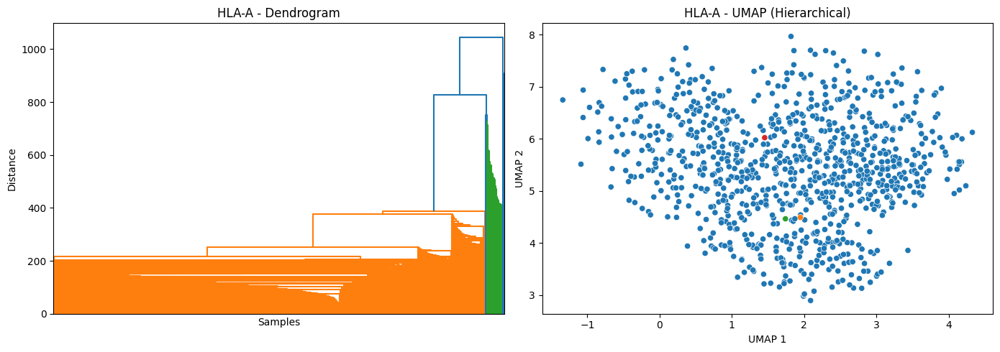

In [ ]:
# Perform hierarchical clustering and generate plots for datasets
# HLA-A binders
labels_A, sil_A = hierarchical('HLA-A', data_hla_A_scaled, n_clusters=4)

Hierarchical Clustering Silhouette Score: 0.7163281796256908


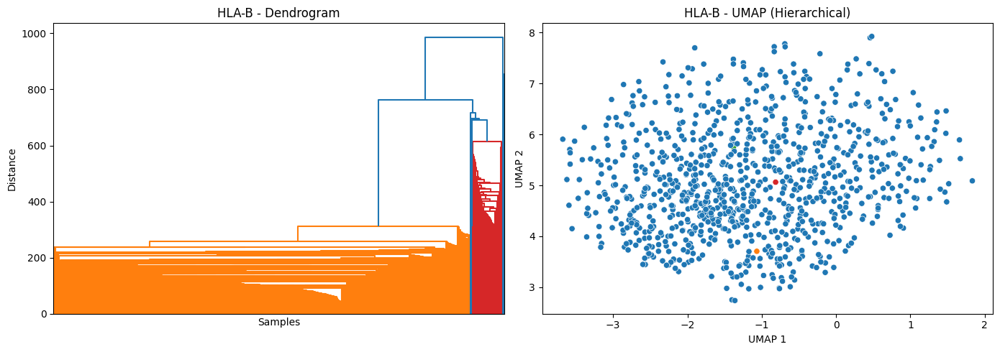

In [ ]:
# HLA-B binders
labels_B, sil_B = hierarchical('HLA-B', data_hla_B_scaled, n_clusters=4)

In [ ]:
# Both HLA-A and HLA-B binders
# labels_AB, sil_AB = hierarchical('HLA-A and HLA-B', data_hla_AB_scaled, n_clusters=4)